# comparing_model3 — per-bin GM12878 CAGE vs cross-cell-type average CAGE

Per-bin peak comparison rather than whole-region correlation, so a peak threshold is needed first.
Examples = the 5 regions `comparing_model2` §7–§13 plot (top 5 non-blacklisted by
`min(ΔR vs Enformer, ΔR vs AlphaGenome)`), recomputed in §1.

## 1. Reload

Guarded by `in globals()`. Cold kernel ~5 min, mostly the 35 GB Enformer track slice.

In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zarr
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import Track, GeneAnnotation, plot_tracks

MODEL_OUT = '/data1/lesliec/sarthak/data/joint_playground/model_out'
ENFORMER_NPY = '/data1/lesliec/sarthak/data/enformer/data/model_out/enformer.npy'
BED_PATH = '/data1/lesliec/sarthak/data/DK_zarr/sequences_enformer.bed'
LABELS_ZARR = '/data1/lesliec/sarthak/data/enformer/data/labels.zarr'

ENFORMER_TRACK = 5110          # GM12878 CAGE in the Enformer output
ALPHAGENOME_TRACK = 156
CAGE_START = 4675              # labels.zarr CAGE block = 4675:5313 (638 experiments)
SEQ_LEN = 131072
PRED_LEN = 896 * 128           # 114688
BIN = 128
CROP = (SEQ_LEN - PRED_LEN) // 2
CONTEXT = 524288               # blacklist: model input length
HALF_CTX = CONTEXT // 2
OVERLAP_FRAC = 0.20

mamba_key = 'GM12878_no_mlm_predictions.npy'
enformer_key = 'enformer'
ag_key = 'alphagenome_cage_test_128bp.npy'
model_names = [enformer_key, mamba_key, ag_key]

# --- predictions + shared GM12878 CAGE target -------------------------------------
if 'preds' not in globals() or 't1' not in globals():
    enformer_full = np.load(ENFORMER_NPY, mmap_mode='r')
    preds = {}
    for m in model_names:
        if m == enformer_key:
            preds[m] = enformer_full[:, :, ENFORMER_TRACK]
        elif m == ag_key:
            preds[m] = np.load(f'{MODEL_OUT}/{m}', mmap_mode='r')[:, :, ALPHAGENOME_TRACK]
        else:
            _a = np.load(f'{MODEL_OUT}/{m}')
            preds[m] = _a[:, :, 0] if _a.ndim == 3 else _a
    t1 = np.load(f'{MODEL_OUT}/GM12878_base_targets_conv.npy')
    print('loaded predictions + targets')
else:
    print('preds/t1 already in memory - skipped')

# --- ranking metric: smoothed-log Pearson ------------------------------------------
SMOOTH_SIGMA = 1.5


def smoothed_log_pearson(pred, true, sigma=SMOOTH_SIGMA):
    p = gaussian_filter1d(np.log1p(np.clip(pred, 0, None)), sigma=sigma)
    t = gaussian_filter1d(np.log1p(np.clip(true, 0, None)), sigma=sigma)
    if np.std(p) < 1e-8 or np.std(t) < 1e-8:
        return np.nan
    return pearsonr(p, t)[0]


if 'pearson_smooth_results' not in globals():
    pearson_smooth_results = {}
    for name, arr in preds.items():
        pearson_smooth_results[name] = np.array(
            [smoothed_log_pearson(arr[i], t1[i]) for i in tqdm(range(arr.shape[0]), desc=name)])
else:
    print('pearson_smooth_results already in memory - skipped')

# --- genomic coordinates of each test region's predicted window --------------------
if '_test_bed' not in globals():
    _bed = pd.read_csv(BED_PATH, sep='\t', header=None)
    _test_bed = _bed[_bed.iloc[:, -1] == 'test'].reset_index(drop=True)
    print(f'test regions: {len(_test_bed)}')
else:
    print('region BED already in memory - skipped')


def region_coords(idx):
    chrom = str(_test_bed.iloc[idx, 0])
    start = int(_test_bed.iloc[idx, 1]) + CROP
    return chrom, start, start + PRED_LEN


# --- cross-cell-type average CAGE --------------------------------------------------
if '_labels_test' not in globals():
    _labels_test = zarr.open(LABELS_ZARR, mode='r')['test']
    print('labels.zarr test:', _labels_test.shape)


def avg_cage_profile(idx):
    """Mean over all 638 CAGE experiments at each of the 896 bins."""
    return np.asarray(_labels_test[idx, :, CAGE_START:]).mean(axis=1)


# --- gene annotation ---------------------------------------------------------------
if 'ann' not in globals():
    ann = GeneAnnotation()
    print('annotation rows:', len(ann.df))
else:
    print('gene annotation already in memory - skipped')

# --- blacklist: extended-524288 train windows overlapping >20% of a test region ----
if 'allowed' not in globals():
    if '_bed' not in globals():
        _bed = pd.read_csv(BED_PATH, sep='\t', header=None)
    _split_col = _bed.shape[1] - 1
    _train_by_chrom = {}
    for chrom, g in _bed[_bed[_split_col] == 'train'].groupby(0):
        ce = (g[1].astype(int).to_numpy() + g[2].astype(int).to_numpy()) // 2
        _train_by_chrom[str(chrom)] = (ce - HALF_CTX, ce + HALF_CTX)
    blacklisted = np.zeros(len(_test_bed), dtype=bool)
    for i in range(len(_test_bed)):
        chrom = str(_test_bed.iloc[i, 0])
        c, d = int(_test_bed.iloc[i, 1]), int(_test_bed.iloc[i, 2])
        if chrom not in _train_by_chrom:
            continue
        a, b = _train_by_chrom[chrom]
        if np.any(np.maximum(0, np.minimum(b, d) - np.maximum(a, c)) > OVERLAP_FRAC * (d - c)):
            blacklisted[i] = True
    allowed = ~blacklisted
    print(f'Blacklisted {blacklisted.sum()} / {len(blacklisted)} test regions; '
          f'{allowed.sum()} allowed')
else:
    print('blacklist already in memory - skipped')


def top_allowed(score, n=3):
    ranked = np.where(np.isnan(score) | ~allowed, -np.inf, score)
    return np.argsort(ranked)[-n:][::-1]


COLORS = {mamba_key: '#2ca02c', enformer_key: '#1f77b4', ag_key: '#ff7f0e'}
PRETTY = {mamba_key: 'Mamba (GM12878)', enformer_key: 'Enformer', ag_key: 'AlphaGenome'}
print('\n§1 reload complete.')

loaded predictions + targets


enformer: 100%|██████████| 1937/1937 [00:03<00:00, 518.61it/s]


GM12878_no_mlm_predictions.npy: 100%|██████████| 1937/1937 [00:01<00:00, 1383.68it/s]


alphagenome_cage_test_128bp.npy: 100%|██████████| 1937/1937 [00:01<00:00, 1236.86it/s]


test regions: 1937
labels.zarr test: (1937, 896, 5313)


annotation rows: 3222714
Blacklisted 54 / 1937 test regions; 1883 allowed

§1 reload complete.


## 2. Examples and the two tracks

`TRUE` = GM12878 conv target, `AVG` = mean over the 638 CAGE experiments. The assert confirms
`t1` is `labels.zarr[..., 5110]`, so both share units.

In [2]:
delta_enf = pearson_smooth_results[mamba_key] - pearson_smooth_results[enformer_key]
delta_ag = pearson_smooth_results[mamba_key] - pearson_smooth_results[ag_key]
delta_both = np.minimum(delta_enf, delta_ag)

EXAMPLES = top_allowed(delta_both, n=5)      # same 5 regions as comparing_model2 §7-§13
print('EXAMPLES:', EXAMPLES.tolist())
for rank, idx in enumerate(EXAMPLES):
    c, s, e = region_coords(idx)
    print(f'  rank {rank+1}  idx {idx:>4}  {c}:{s:,}-{e:,}  min dR={delta_both[idx]:.3f}  '
          f'(Enf {delta_enf[idx]:.3f}, AG {delta_ag[idx]:.3f})')

_chk = np.asarray(_labels_test[EXAMPLES[0], :, ENFORMER_TRACK])
assert np.array_equal(_chk, np.asarray(t1[EXAMPLES[0]])), 't1 != labels.zarr[..., 5110]'
print(f'\nt1 == labels.zarr[..., {ENFORMER_TRACK}] (exact) -> TRUE and AVG share units')

TRUE = np.stack([np.asarray(t1[i]) for i in EXAMPLES])            # (5, 896)
AVG = np.stack([avg_cage_profile(i) for i in EXAMPLES])           # (5, 896)
T, A = TRUE.ravel(), AVG.ravel()
print(f'TRUE {TRUE.shape}  AVG {AVG.shape}  -> {T.size} bins pooled')

TRUE_C, AVG_C = '#d62728', '#1f77b4'

EXAMPLES: [1811, 803, 1797, 560, 962]
  rank 1  idx 1811  chrX:37,294,029-37,408,717  min dR=0.483  (Enf 0.483, AG 0.620)
  rank 2  idx  803  chr19:22,555,439-22,670,127  min dR=0.393  (Enf 0.393, AG 0.603)
  rank 3  idx 1797  chr11:44,831,307-44,945,995  min dR=0.393  (Enf 0.393, AG 0.449)
  rank 4  idx  560  chr7:57,452,857-57,567,545  min dR=0.365  (Enf 0.365, AG 0.725)
  rank 5  idx  962  chr19:56,696,668-56,811,356  min dR=0.364  (Enf 0.364, AG 0.727)



t1 == labels.zarr[..., 5110] (exact) -> TRUE and AVG share units


TRUE (5, 896)  AVG (5, 896)  -> 4480 bins pooled


## 2b. Background sample

`N_BG` random allowed regions for context, ~3 s each. `0` skips.

In [3]:
N_BG = 40

if N_BG and 'bgT' not in globals():
    rng = np.random.default_rng(0)
    bg_idx = rng.choice(np.flatnonzero(allowed), N_BG, replace=False)
    bgT = np.concatenate([np.asarray(t1[i]) for i in bg_idx])
    bgA = np.concatenate([avg_cage_profile(i) for i in tqdm(bg_idx, desc='background')])
    print(f'background: {N_BG} random allowed regions, {bgT.size} bins')
elif N_BG:
    print('background already in memory - skipped')
else:
    bgT = bgA = None
    print('background skipped (N_BG = 0)')

background: 100%|██████████| 40/40 [02:00<00:00,  2.97s/it]


background: 100%|██████████| 40/40 [02:00<00:00,  3.00s/it]


background: 40 random allowed regions, 35840 bins


## 3. Distributions

**A** nonzero values (log) · **B** vs background · **C** bins above threshold · **D** merged peaks ·
**E** fraction of region max · **F** rank plot. Vertical lines = the §5 cutoffs.

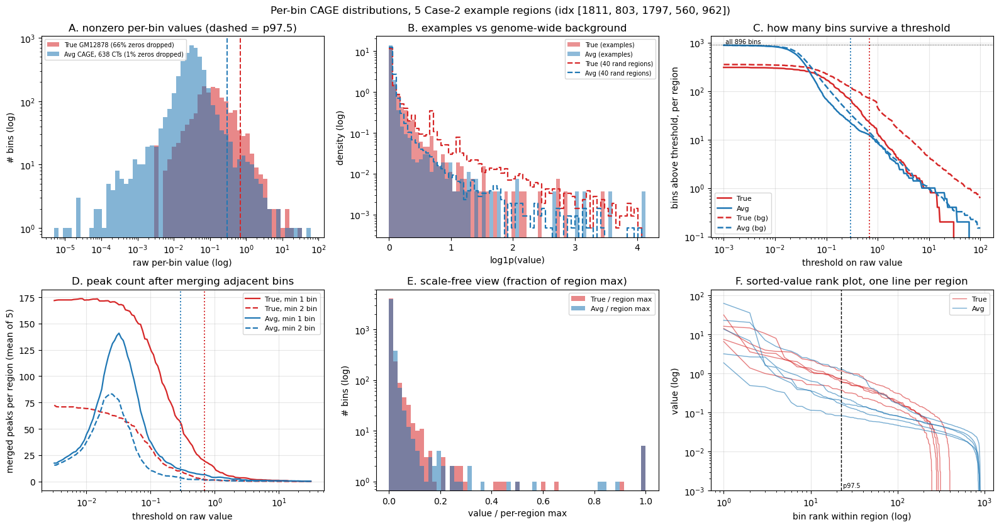

In [4]:
PCTL = 97.5                      # per-track percentile cutoff (see §5)
thr_true = np.percentile(T, PCTL)
thr_avg = np.percentile(A, PCTL)


def n_runs(prof, thr, min_len=1):
    """Number of runs of consecutive bins >= thr, keeping runs of >= min_len bins."""
    m = (prof >= thr).astype(np.int8)
    d = np.diff(np.concatenate(([0], m, [0])))
    s, e = np.flatnonzero(d == 1), np.flatnonzero(d == -1)
    return int(((e - s) >= min_len).sum())


fig, axes = plt.subplots(2, 3, figsize=(16, 8.5))

# --- A: log-spaced histogram of NONZERO values ------------------------------------
ax = axes[0, 0]
lo = min(A[A > 0].min(), T[T > 0].min())
lbins = np.logspace(np.log10(lo), np.log10(max(A.max(), T.max())), 60)
ax.hist(T[T > 0], bins=lbins, color=TRUE_C, alpha=0.55,
        label=f'True GM12878 ({(T == 0).mean():.0%} zeros dropped)')
ax.hist(A[A > 0], bins=lbins, color=AVG_C, alpha=0.55,
        label=f'Avg CAGE, 638 CTs ({(A == 0).mean():.0%} zeros dropped)')
for v, c in [(thr_true, TRUE_C), (thr_avg, AVG_C)]:
    ax.axvline(v, color=c, ls='--', lw=1.4)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('raw per-bin value (log)')
ax.set_ylabel('# bins (log)')
ax.set_title(f'A. nonzero per-bin values (dashed = p{PCTL})')
ax.legend(fontsize=7)

# --- B: examples vs genome-wide background ----------------------------------------
ax = axes[0, 1]
bins = np.linspace(0, np.log1p(max(A.max(), T.max())), 70)
for v, c, lab in [(T, TRUE_C, 'True (examples)'), (A, AVG_C, 'Avg (examples)')]:
    ax.hist(np.log1p(v), bins=bins, color=c, alpha=0.5, density=True, label=lab)
if bgT is not None:
    for v, c, lab in [(bgT, TRUE_C, f'True ({N_BG} rand regions)'),
                      (bgA, AVG_C, f'Avg ({N_BG} rand regions)')]:
        h, e = np.histogram(np.log1p(v), bins=bins, density=True)
        ax.step(e[:-1], h, where='post', color=c, lw=1.6, ls='--', label=lab)
ax.set_yscale('log')
ax.set_xlabel('log1p(value)')
ax.set_ylabel('density (log)')
ax.set_title('B. examples vs genome-wide background')
ax.legend(fontsize=7)

# --- C: bins above threshold ------------------------------------------------------
ax = axes[0, 2]
th = np.logspace(-3, 2, 300)
series = [(T, TRUE_C, 'True', len(EXAMPLES), '-'), (A, AVG_C, 'Avg', len(EXAMPLES), '-')]
if bgT is not None:
    series += [(bgT, TRUE_C, 'True (bg)', N_BG, '--'), (bgA, AVG_C, 'Avg (bg)', N_BG, '--')]
for v, c, lab, n, ls in series:
    ax.plot(th, [(v >= t).sum() / n for t in th], color=c, lw=1.8, ls=ls, label=lab)
for v, c in [(thr_true, TRUE_C), (thr_avg, AVG_C)]:
    ax.axvline(v, color=c, ls=':', lw=1.4)
ax.set_xscale('log')
ax.set_yscale('log')
ax.axhline(896, color='k', lw=0.7, ls=':')
ax.text(1e-3, 896, ' all 896 bins', fontsize=7, va='bottom')
ax.set_xlabel('threshold on raw value')
ax.set_ylabel('bins above threshold, per region')
ax.set_title('C. how many bins survive a threshold')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

# --- D: merged peak count ---------------------------------------------------------
ax = axes[1, 0]
th2 = np.logspace(-2.5, 1.5, 120)
for M, c, lab in [(TRUE, TRUE_C, 'True'), (AVG, AVG_C, 'Avg')]:
    for ml, ls in [(1, '-'), (2, '--')]:
        ax.plot(th2, [np.mean([n_runs(p, t, ml) for p in M]) for t in th2],
                color=c, lw=1.6, ls=ls, label=f'{lab}, min {ml} bin')
for v, c in [(thr_true, TRUE_C), (thr_avg, AVG_C)]:
    ax.axvline(v, color=c, ls=':', lw=1.4)
ax.set_xscale('log')
ax.set_xlabel('threshold on raw value')
ax.set_ylabel(f'merged peaks per region (mean of {len(EXAMPLES)})')
ax.set_title('D. peak count after merging adjacent bins')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

# --- E: normalized by per-region max ----------------------------------------------
ax = axes[1, 1]
nb = np.linspace(0, 1, 60)
ax.hist((TRUE / TRUE.max(axis=1, keepdims=True)).ravel(), bins=nb, color=TRUE_C,
        alpha=0.55, label='True / region max')
ax.hist((AVG / AVG.max(axis=1, keepdims=True)).ravel(), bins=nb, color=AVG_C,
        alpha=0.55, label='Avg / region max')
ax.set_yscale('log')
ax.set_xlabel('value / per-region max')
ax.set_ylabel('# bins (log)')
ax.set_title('E. scale-free view (fraction of region max)')
ax.legend(fontsize=8)

# --- F: sorted-value rank plot ----------------------------------------------------
ax = axes[1, 2]
rank = np.arange(1, 897)
for M, c, lab in [(TRUE, TRUE_C, 'True'), (AVG, AVG_C, 'Avg')]:
    for j, p in enumerate(M):
        ax.plot(rank, np.sort(p)[::-1], color=c, lw=1.0, alpha=0.6, label=lab if j == 0 else None)
ax.axvline(896 * (1 - PCTL / 100), color='k', lw=1.0, ls='--')
ax.text(896 * (1 - PCTL / 100), 1.2e-3, f' p{PCTL}', fontsize=7)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(1e-3, None)
ax.set_xlabel('bin rank within region (log)')
ax.set_ylabel('value (log)')
ax.set_title('F. sorted-value rank plot, one line per region')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

fig.suptitle(f'Per-bin CAGE distributions, {len(EXAMPLES)} Case-2 example regions '
             f'(idx {EXAMPLES.tolist()})', fontsize=12)
fig.tight_layout()
plt.show()

## 4. Threshold tables

Quantile → value, absolute → counts, and count-matched thresholds.

In [5]:
qs = [50, 75, 90, 95, 97.5, 99, 99.5]
print(f'=== quantile -> absolute value ({T.size} bins pooled) ===')
print(f"{'q':>7} {'true':>10} {'avg':>10} {'bins/region':>13}")
for q in qs:
    print(f'{q:>7} {np.percentile(T, q):>10.3f} {np.percentile(A, q):>10.3f} '
          f'{896 * (1 - q / 100):>13.1f}')

print('\n=== absolute threshold -> bins & merged peaks per region ===')
print(f"{'thr':>8} | {'true bins':>9} {'true pk':>8} {'true pk>=2':>11} | "
      f"{'avg bins':>9} {'avg pk':>7} {'avg pk>=2':>10}")
for t in [0.05, 0.1, 0.2, 0.3, 0.5, 1.0, 2.0, 5.0]:
    print(f'{t:>8.2f} | {(TRUE >= t).sum() / len(EXAMPLES):>9.1f} '
          f'{np.mean([n_runs(p, t) for p in TRUE]):>8.1f} '
          f'{np.mean([n_runs(p, t, 2) for p in TRUE]):>11.1f} | '
          f'{(AVG >= t).sum() / len(EXAMPLES):>9.1f} '
          f'{np.mean([n_runs(p, t) for p in AVG]):>7.1f} '
          f'{np.mean([n_runs(p, t, 2) for p in AVG]):>10.1f}')

print('\n=== count-matched thresholds ===')
print(f"{'bins/region':>12} {'true thr':>10} {'avg thr':>10}")
for k in [5, 10, 20, 30, 45, 90]:
    q = 100 * (1 - k / 896)
    print(f'{k:>12} {np.percentile(T, q):>10.3f} {np.percentile(A, q):>10.3f}')

print('\n=== distribution summaries ===')
for nm, v in [('true', T), ('avg', A)]:
    print(f'{nm:>5}: mean={v.mean():.4f}  median={np.median(v):.4f}  '
          f'median(nonzero)={np.median(v[v > 0]):.4f}  frac_zero={(v == 0).mean():.3f}  '
          f'max={v.max():.2f}')
print('per-region max:  true', np.round(TRUE.max(axis=1), 2),
      '  avg', np.round(AVG.max(axis=1), 2))

=== quantile -> absolute value (4480 bins pooled) ===
      q       true        avg   bins/region
     50      0.000      0.032         448.0
     75      0.062      0.050         224.0
     90      0.213      0.083          89.6
     95      0.408      0.142          44.8
   97.5      0.692      0.295          22.4
     99      1.358      0.900           9.0
   99.5      2.267      1.693           4.5

=== absolute threshold -> bins & merged peaks per region ===
     thr | true bins  true pk  true pk>=2 |  avg bins  avg pk  avg pk>=2
    0.05 |     243.4    160.2        54.0 |     224.2   108.4       46.0
    0.10 |     168.8    124.0        31.2 |      67.4    37.6       10.6
    0.20 |      93.6     76.2        13.4 |      31.6    16.8        5.0
    0.30 |      66.2     54.6         9.8 |      22.0    11.6        3.2
    0.50 |      32.6     27.6         3.6 |      14.4     7.6        1.8
    1.00 |      13.0     11.2         1.2 |       8.4     3.8        1.4
    2.00 |       5.6 

## 5. Peak calls from a per-track percentile cutoff

Each track cut at its own `PCTL` of the pooled bins, so the two peak sets are count-matched.
`MIN_BINS` drops single-bin spikes; `POOL_SCOPE` picks `'examples'` or `'background'`.

In [6]:
PCTL = 97.5
MIN_BINS = 2
POOL_SCOPE = 'examples'          # 'examples' or 'background'

pool_T, pool_A = (T, A) if POOL_SCOPE == 'examples' else (bgT, bgA)
thr_true = np.percentile(pool_T, PCTL)
thr_avg = np.percentile(pool_A, PCTL)
print(f'p{PCTL} over {POOL_SCOPE} ({pool_T.size} bins):  '
      f'thr_true = {thr_true:.3f}   thr_avg = {thr_avg:.3f}')


def call_peaks(prof, thr, min_bins=MIN_BINS):
    """Peaks as runs of consecutive bins >= thr, keeping runs of >= min_bins.
    Returns [(bin_start, bin_end_exclusive, summit_bin, max_value), ...]."""
    m = (np.asarray(prof) >= thr).astype(np.int8)
    d = np.diff(np.concatenate(([0], m, [0])))
    out = []
    for s, e in zip(np.flatnonzero(d == 1), np.flatnonzero(d == -1)):
        if e - s >= min_bins:
            out.append((int(s), int(e), int(s + np.argmax(prof[s:e])), float(prof[s:e].max())))
    return out


peaks_true = {int(i): call_peaks(TRUE[j], thr_true) for j, i in enumerate(EXAMPLES)}
peaks_avg = {int(i): call_peaks(AVG[j], thr_avg) for j, i in enumerate(EXAMPLES)}

print('\npeaks = merged runs; both/only columns are BIN counts')
print(f"{'idx':>6} {'true pk':>8} {'avg pk':>7} | {'both':>6} {'true only':>10} {'avg only':>9}")
for j, i in enumerate(EXAMPLES):
    mt = TRUE[j] >= thr_true
    ma = AVG[j] >= thr_avg
    print(f'{i:>6} {len(peaks_true[int(i)]):>8} {len(peaks_avg[int(i)]):>7} | '
          f'{int((mt & ma).sum()):>6} {int((mt & ~ma).sum()):>10} {int((~mt & ma).sum()):>9}')

mt, ma = TRUE >= thr_true, AVG >= thr_avg
print(f'\npooled bins: both {int((mt & ma).sum())}, true-only {int((mt & ~ma).sum())}, '
      f'avg-only {int((~mt & ma).sum())}, neither {int((~mt & ~ma).sum())}  '
      f'(Jaccard {(mt & ma).sum() / (mt | ma).sum():.2f})')

for j, i in enumerate(EXAMPLES[:2]):
    chrom, start, _ = region_coords(i)
    print(f'\nidx {i}  {chrom}:{start:,}  true peaks:')
    for s, e, summit, v in peaks_true[int(i)]:
        print(f'    bins {s:>3}-{e:<3} ({e-s} bin)  summit {summit:>3}  max {v:>7.2f}  '
              f'{chrom}:{start + s * BIN:,}-{start + e * BIN:,}')

p97.5 over examples (4480 bins):  thr_true = 0.692   thr_avg = 0.295

peaks = merged runs; both/only columns are BIN counts
   idx  true pk  avg pk |   both  true only  avg only
  1811        1       3 |      5         17         7
   803        2       1 |      6         16         4
  1797        4       9 |     13         30        53
   560        0       1 |      2          4         3
   962        3       4 |      6         13        13

pooled bins: both 32, true-only 80, avg-only 80, neither 4288  (Jaccard 0.17)

idx 1811  chrX:37,294,029  true peaks:
    bins 174-176 (2 bin)  summit 174  max    3.33  chrX:37,316,301-37,316,557

idx 803  chr19:22,555,439  true peaks:
    bins 410-412 (2 bin)  summit 410  max    2.89  chr19:22,607,919-22,608,175
    bins 447-449 (2 bin)  summit 448  max    1.22  chr19:22,612,655-22,612,911


## 6. Findings

| | true GM12878 | avg over 638 CTs |
|---|---|---|
| bins exactly 0 | 66% | 0.6% |
| median | 0.000 | 0.032 |
| p95 / p97.5 / p99 | 0.408 / 0.692 / 1.358 | 0.142 / 0.295 / 0.900 |

- **No shared absolute cutoff.** Averaging 638 experiments replaces the hard zero floor with a
  background lobe at ~0.03, so any cutoff below that calls nearly every avg bin a peak — panel D's
  avg curve *rises* to ~140 peaks/region there.
- **Per-track percentile fixes that** and count-matches the sets. Cost: it can never call a region
  peak-free.
- **These 5 regions are low-signal outliers** (background true p95 1.073 vs 0.408) — use
  `POOL_SCOPE = 'background'` for anything global.
- **Region scale varies:** maxima 6.5–31 (true), 1.9–62 (avg). A pooled percentile treats windows
  unequally; per-region top-*k* (F) or fraction-of-max (E) is the alternative.
- **`AVG` is a mean** — one cell type contributes value/638, and GM12878 itself is in it (column 435).

Next: per-bin contingency (GM12878-only / avg-only / both), painted onto `plot_tracks` and scored
per model.

## 7. Per-region raw-value histograms

One panel per example region: true GM12878 target vs the cross-cell-type average, raw values on a
linear x-axis, log y. Each track is binned over its **own** `0 .. max` so the average's larger
maximum does not squeeze the true track into one bar — the two therefore do not share bin edges,
and bar widths are not comparable between the two colours within a panel.

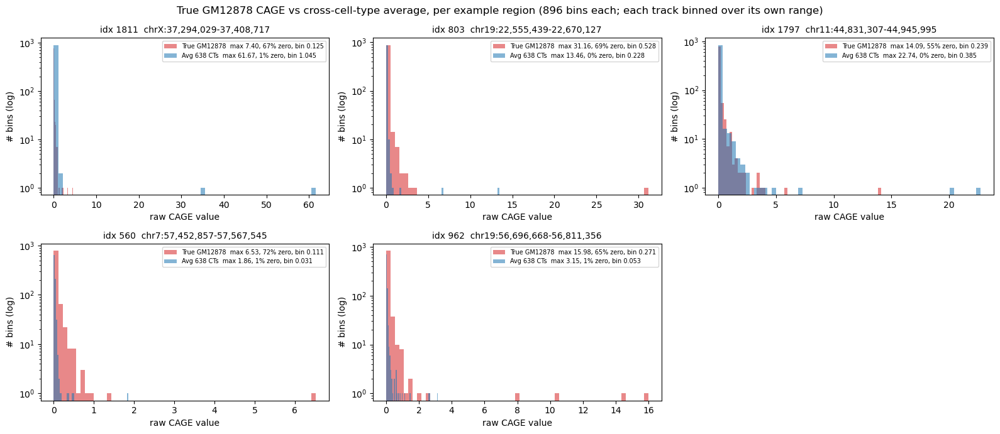

In [7]:
# §7 - true GM12878 target vs cross-cell-type average CAGE, one panel per example region.
# Raw values, linear x, log y. Each track gets its OWN bins over 0 .. its max, so the average's
# larger maximum does not collapse the true track into a single bar. Consequence: the two colours
# do not share bin edges within a panel, so their bar WIDTHS are not comparable (their heights,
# both "# bins out of 896", still are).
HIST_BINS = 60

fig, axes = plt.subplots(2, 3, figsize=(16, 7))
for j, idx in enumerate(EXAMPLES):
    ax = axes.flat[j]
    chrom, start, end = region_coords(idx)
    for v, c, nm in [(TRUE[j], TRUE_C, 'True GM12878'), (AVG[j], AVG_C, 'Avg 638 CTs')]:
        ax.hist(v, bins=np.linspace(0, v.max(), HIST_BINS), color=c, alpha=0.55,
                label=f'{nm}  max {v.max():.2f}, {(v == 0).mean():.0%} zero, '
                      f'bin {v.max() / (HIST_BINS - 1):.3f}')
    ax.set_yscale('log')
    ax.set_xlabel('raw CAGE value')
    ax.set_ylabel('# bins (log)')
    ax.set_title(f'idx {idx}  {chrom}:{start:,}-{end:,}', fontsize=10)
    ax.legend(fontsize=7)
for k in range(len(EXAMPLES), axes.size):
    axes.flat[k].axis('off')

fig.suptitle('True GM12878 CAGE vs cross-cell-type average, per example region '
             f'({TRUE.shape[1]} bins each; each track binned over its own range)', fontsize=12)
fig.tight_layout()
plt.show()

## 8. Genome-wide scan for the `avg > 2*true` rule, and the worst regions

Rule, per bin: `AVG > 2*TRUE` **and** `AVG >= p95(AVG)` **and** `TRUE < p95(TRUE)`.

Percentiles are **global** over all allowed test bins, not per region — a per-region p95 would give
every window ~45 top-5% bins by construction and flatten the ranking. The scan mean-pools the 638
CAGE experiments for all 1,937 test regions in chunk-aligned batches of 32 (the zarr chunk size),
~3 min, cached to `avg_cage_test_all.npy` next to `labels.zarr`.

In [8]:
# §8a - scan every test region for rule bins. The zarr chunk is (32, 896, 5313), so reading
# chunk-aligned batches of 32 regions costs one decompress per 32 regions instead of per region
# (~0.09 s/region vs ~2.8 s). Result cached next to labels.zarr.
import os
import time

AVG_CACHE = '/data1/lesliec/sarthak/data/enformer/data/avg_cage_test_all.npy'
ZARR_CHUNK = 32

if os.path.exists(AVG_CACHE):
    AVG_ALL = np.load(AVG_CACHE)
    print(f'loaded cached AVG_ALL {AVG_ALL.shape} from {AVG_CACHE}')
else:
    AVG_ALL = np.empty((_labels_test.shape[0], 896), dtype=np.float32)
    t0 = time.time()
    for s in range(0, _labels_test.shape[0], ZARR_CHUNK):
        e = min(s + ZARR_CHUNK, _labels_test.shape[0])
        AVG_ALL[s:e] = np.asarray(_labels_test[s:e, :, CAGE_START:]).mean(axis=2)
    np.save(AVG_CACHE, AVG_ALL)
    print(f'scanned in {(time.time() - t0) / 60:.1f} min -> cached {AVG_CACHE}')

TRUE_ALL = np.asarray(t1, dtype=np.float32)

# global p95 over allowed test bins
THR_A = float(np.percentile(AVG_ALL[allowed], 95))
THR_T = float(np.percentile(TRUE_ALL[allowed], 95))
print(f'global p95 (allowed bins):  avg {THR_A:.4f}   true {THR_T:.4f}')

C1 = AVG_ALL > 2 * TRUE_ALL          # average more than double GM12878
C2 = AVG_ALL >= THR_A                # in the top 5% of average values
C3 = TRUE_ALL < THR_T                # NOT in the top 5% of GM12878 values
RULE = C1 & C2 & C3
rule_count = np.where(allowed, RULE.sum(axis=1), -1)

print(f'rule bins per allowed region: mean {RULE[allowed].sum(axis=1).mean():.1f}, '
      f'median {np.median(RULE[allowed].sum(axis=1)):.0f}, max {rule_count.max()}, '
      f'{(RULE[allowed].sum(axis=1) == 0).mean():.1%} of regions have none')

WORST = np.argsort(rule_count)[-5:][::-1]
print('\ntop 5 allowed regions by rule-bin count:')
for r, i in enumerate(WORST):
    chrom, start, end = region_coords(i)
    print(f'  {r+1}. idx {i:>4}  {chrom}:{start:,}-{end:,}  {RULE[i].sum():>3} rule bins  '
          f'(avg>=p95 alone: {C2[i].sum():>3})  true max {TRUE_ALL[i].max():>6.1f}  '
          f'avg max {AVG_ALL[i].max():>6.1f}')

loaded cached AVG_ALL (1937, 896) from /data1/lesliec/sarthak/data/enformer/data/avg_cage_test_all.npy
global p95 (allowed bins):  avg 0.2450   true 1.0312
rule bins per allowed region: mean 11.9, median 4, max 205, 17.2% of regions have none

top 5 allowed regions by rule-bin count:
  1. idx 1758  chr14:100,819,717-100,934,405  205 rule bins  (avg>=p95 alone: 261)  true max   14.4  avg max   60.6
  2. idx 1447  chr11:35,197,431-35,312,119  197 rule bins  (avg>=p95 alone: 290)  true max   33.0  avg max   34.8
  3. idx 1384  chr15:25,005,401-25,120,089  159 rule bins  (avg>=p95 alone: 283)  true max    6.5  avg max    3.2
  4. idx 1900  chr11:35,082,742-35,197,430  151 rule bins  (avg>=p95 alone: 310)  true max  412.0  avg max  264.2
  5. idx 1576  chr3:188,870,350-188,985,038  136 rule bins  (avg>=p95 alone: 166)  true max    9.5  avg max    6.8


### 8b. Tracks for the 5 worst regions

Same track stack as `comparing_model2` §8: the three model predictions, the cross-cell-type average,
and the GM12878 target as ground truth, over a gene track. The extra bottom axis marks where the
rule holds — upper band = `AVG >= p95` alone (the 95th-percentile condition), lower band = all three
conditions. Printed under each figure: the rule bins as genomic intervals, and how often each model
exceeds its own regional p95 inside them.

rank 1 (idx 1758)  chr14:100,819,717-100,934,405  205 rule bins in 76 run(s):
    bins  37-37  ( 1 bin)  chr14:100,824,453-100,824,581   avg max    0.41  true max   0.00
    bins  48-48  ( 1 bin)  chr14:100,825,861-100,825,989   avg max    0.58  true max   0.00
    bins  59-63  ( 5 bin)  chr14:100,827,269-100,827,909   avg max    1.21  true max   0.12
    bins  66-66  ( 1 bin)  chr14:100,828,165-100,828,293   avg max    0.70  true max   0.19
    bins  70-100 (31 bin)  chr14:100,828,677-100,832,645   avg max   12.98  true max   0.47
    bins 103-104 ( 2 bin)  chr14:100,832,901-100,833,157   avg max    0.96  true max   0.00
    bins 106-121 (16 bin)  chr14:100,833,285-100,835,333   avg max    2.13  true max   0.72
    bins 123-123 ( 1 bin)  chr14:100,835,461-100,835,589   avg max    1.54  true max   0.06
    bins 126-126 ( 1 bin)  chr14:100,835,845-100,835,973   avg max    0.81  true max   0.00
    bins 129-129 ( 1 bin)  chr14:100,836,229-100,836,357   avg max    0.81  true max   0.13
  

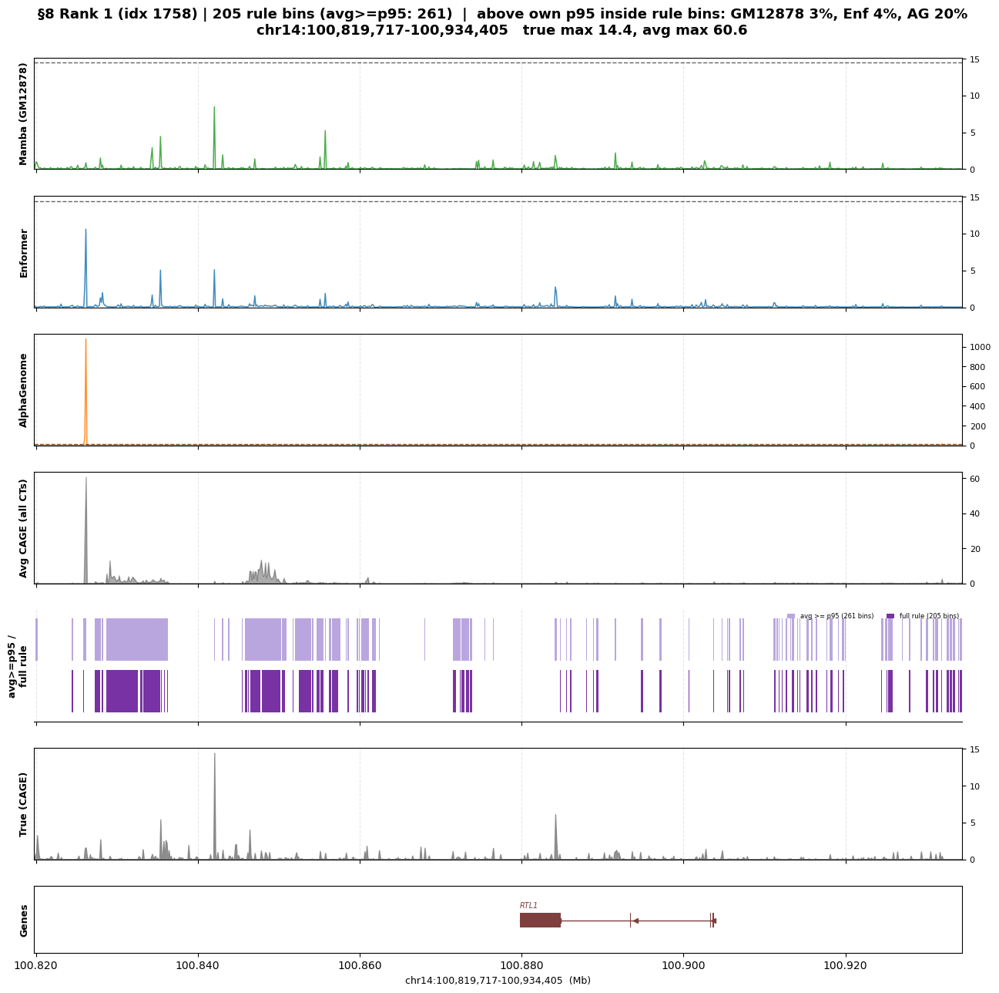

rank 2 (idx 1447)  chr11:35,197,431-35,312,119  197 rule bins in 68 run(s):
    bins   0-0   ( 1 bin)  chr11:35,197,431-35,197,559   avg max    0.31  true max   0.06
    bins   3-4   ( 2 bin)  chr11:35,197,815-35,198,071   avg max    0.49  true max   0.00
    bins   6-7   ( 2 bin)  chr11:35,198,199-35,198,455   avg max    1.14  true max   0.08
    bins   9-9   ( 1 bin)  chr11:35,198,583-35,198,711   avg max    0.29  true max   0.01
    bins  11-14  ( 4 bin)  chr11:35,198,839-35,199,351   avg max    1.70  true max   0.83
    bins  20-25  ( 6 bin)  chr11:35,199,991-35,200,759   avg max    1.73  true max   0.83
    bins  28-30  ( 3 bin)  chr11:35,201,015-35,201,399   avg max    2.87  true max   0.98
    bins  32-34  ( 3 bin)  chr11:35,201,527-35,201,911   avg max    3.16  true max   0.18
    bins  37-40  ( 4 bin)  chr11:35,202,167-35,202,679   avg max    0.38  true max   0.06
    bins  43-45  ( 3 bin)  chr11:35,202,935-35,203,319   avg max    0.49  true max   0.23
    bins  47-51  ( 5 bin

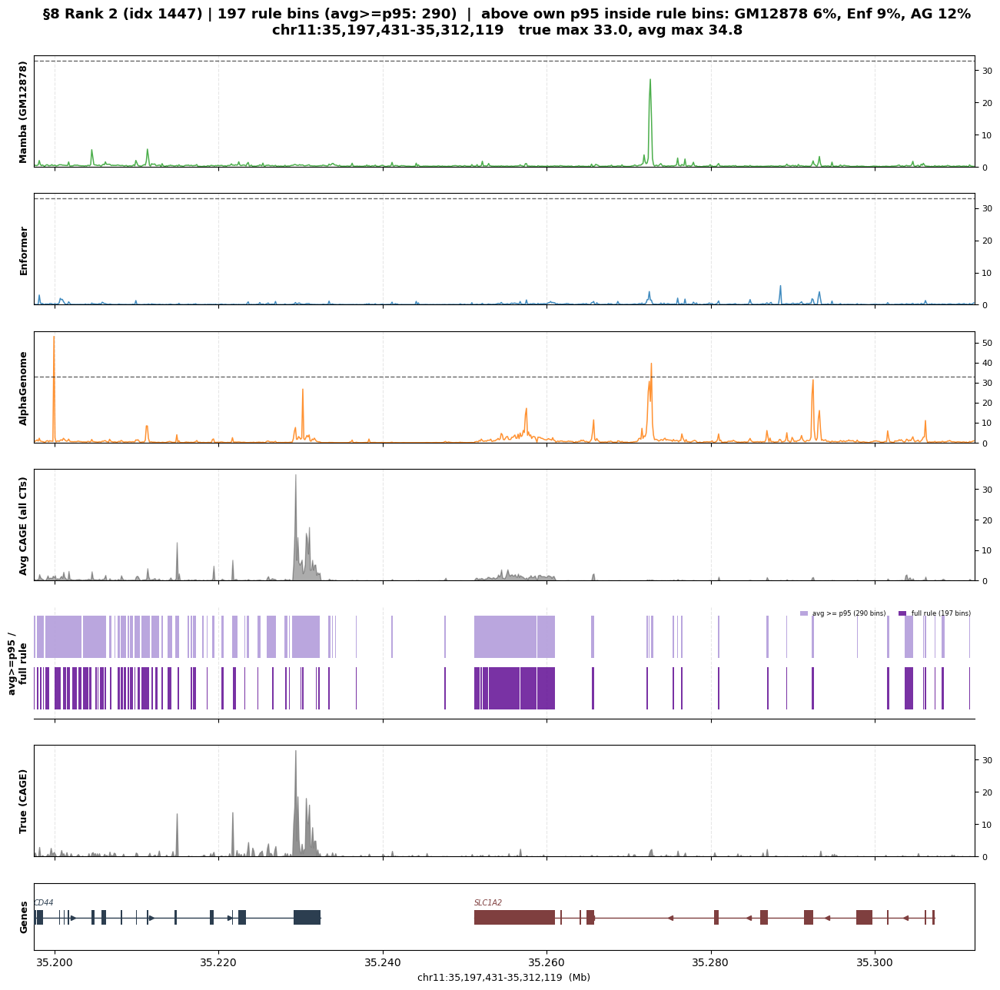

rank 3 (idx 1384)  chr15:25,005,401-25,120,089  159 rule bins in 80 run(s):
    bins   1-1   ( 1 bin)  chr15:25,005,529-25,005,657   avg max    0.35  true max   0.00
    bins   7-8   ( 2 bin)  chr15:25,006,297-25,006,553   avg max    0.30  true max   0.00
    bins  16-17  ( 2 bin)  chr15:25,007,449-25,007,705   avg max    0.39  true max   0.00
    bins  27-30  ( 4 bin)  chr15:25,008,857-25,009,369   avg max    0.43  true max   0.12
    bins  40-42  ( 3 bin)  chr15:25,010,521-25,010,905   avg max    0.35  true max   0.07
    bins  60-61  ( 2 bin)  chr15:25,013,081-25,013,337   avg max    0.41  true max   0.00
    bins  65-66  ( 2 bin)  chr15:25,013,721-25,013,977   avg max    0.47  true max   0.00
    bins  75-76  ( 2 bin)  chr15:25,015,001-25,015,257   avg max    0.48  true max   0.00
    bins  85-85  ( 1 bin)  chr15:25,016,281-25,016,409   avg max    0.55  true max   0.00
    bins 101-102 ( 2 bin)  chr15:25,018,329-25,018,585   avg max    0.46  true max   0.08
    bins 106-106 ( 1 bin

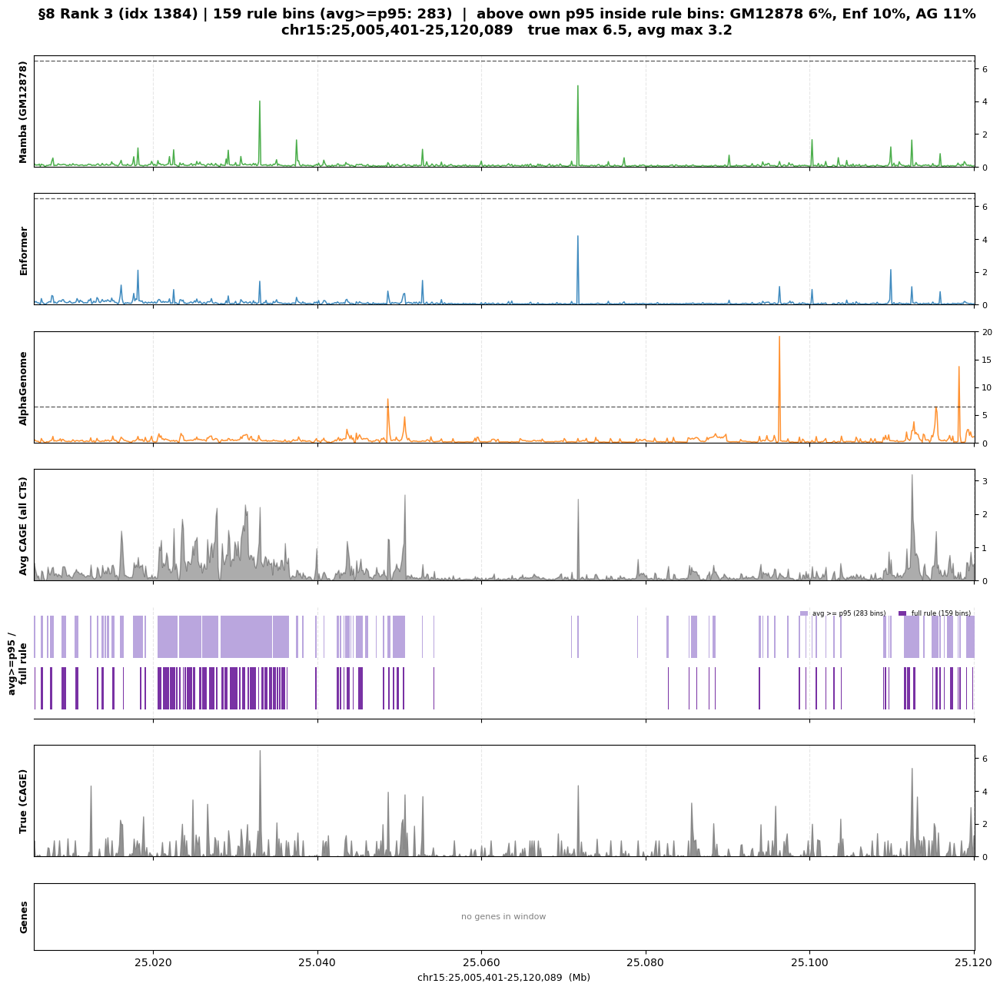

rank 4 (idx 1900)  chr11:35,082,742-35,197,430  151 rule bins in 80 run(s):
    bins   2-2   ( 1 bin)  chr11:35,082,998-35,083,126   avg max    0.28  true max   0.00
    bins   4-4   ( 1 bin)  chr11:35,083,254-35,083,382   avg max    0.38  true max   0.00
    bins   7-7   ( 1 bin)  chr11:35,083,638-35,083,766   avg max    0.82  true max   0.31
    bins   9-11  ( 3 bin)  chr11:35,083,894-35,084,278   avg max    0.39  true max   0.04
    bins 162-162 ( 1 bin)  chr11:35,103,478-35,103,606   avg max    0.51  true max   0.00
    bins 258-258 ( 1 bin)  chr11:35,115,766-35,115,894   avg max    0.27  true max   0.00
    bins 432-432 ( 1 bin)  chr11:35,138,038-35,138,166   avg max    0.28  true max   0.00
    bins 436-436 ( 1 bin)  chr11:35,138,550-35,138,678   avg max    2.24  true max   0.78
    bins 449-449 ( 1 bin)  chr11:35,140,214-35,140,342   avg max    0.88  true max   0.01
    bins 457-457 ( 1 bin)  chr11:35,141,238-35,141,366   avg max    0.43  true max   0.19
    bins 468-468 ( 1 bin

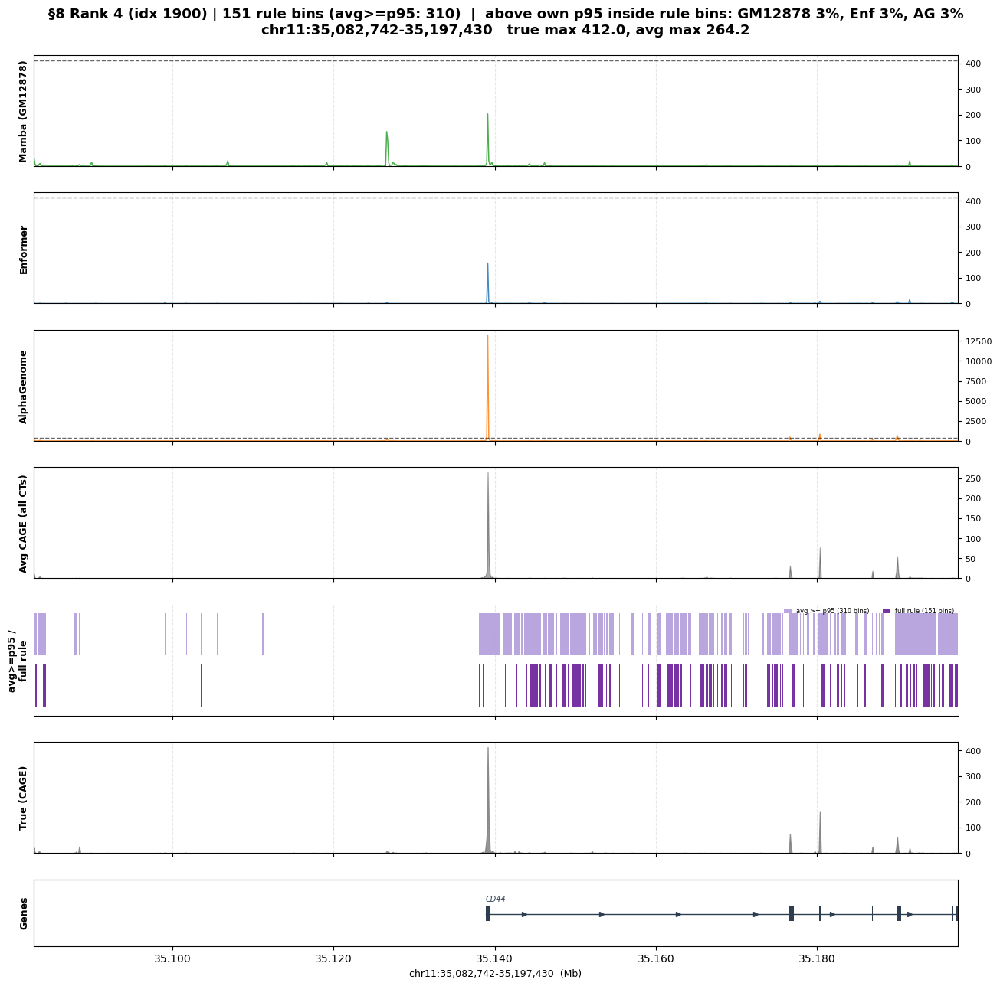

rank 5 (idx 1576)  chr3:188,870,350-188,985,038  136 rule bins in 31 run(s):
    bins  18-18  ( 1 bin)  chr3:188,872,654-188,872,782   avg max    1.15  true max   0.10
    bins  31-55  (25 bin)  chr3:188,874,318-188,877,518   avg max    1.96  true max   0.48
    bins  58-65  ( 8 bin)  chr3:188,877,774-188,878,798   avg max    1.95  true max   0.29
    bins  67-73  ( 7 bin)  chr3:188,878,926-188,879,822   avg max    4.25  true max   0.00
    bins  77-77  ( 1 bin)  chr3:188,880,206-188,880,334   avg max    0.39  true max   0.00
    bins  79-81  ( 3 bin)  chr3:188,880,462-188,880,846   avg max    1.84  true max   0.23
    bins  85-95  (11 bin)  chr3:188,881,230-188,882,638   avg max    2.32  true max   0.18
    bins  98-101 ( 4 bin)  chr3:188,882,894-188,883,406   avg max    3.56  true max   0.00
    bins 106-108 ( 3 bin)  chr3:188,883,918-188,884,302   avg max    1.05  true max   0.02
    bins 111-118 ( 8 bin)  chr3:188,884,558-188,885,582   avg max    0.87  true max   0.18
    bins 125-

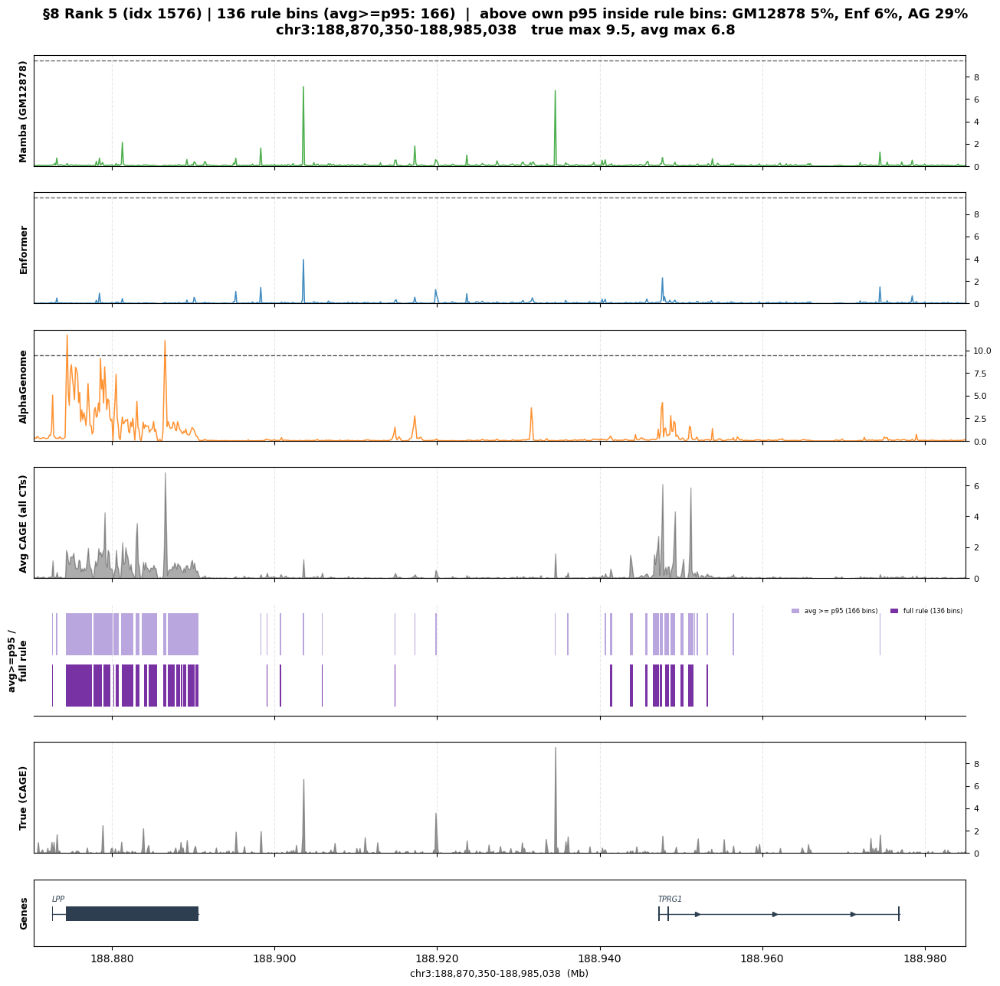

In [9]:
# §8b - track plots for the 5 worst regions, with a rule-indicator axis at the bottom.
# The indicator is its own axis rather than axvspan across the figure, so the signal fills stay
# readable (same reasoning as comparing_model2 §13's mask axis).
from matplotlib.patches import Rectangle

RULE_COLOR = '#6a1b9a'        # full rule (all three conditions)
C2_COLOR = '#b39ddb'          # avg >= p95 only


def bins_to_intervals(mask):
    """Contiguous True runs of a 896-bin mask -> [(bin_start, bin_end_exclusive), ...]."""
    d = np.diff(np.concatenate(([0], mask.astype(np.int8), [0])))
    return list(zip(np.flatnonzero(d == 1).tolist(), np.flatnonzero(d == -1).tolist()))


def draw_rule_track(ax, idx, xlim):
    """Two bands: upper = avg >= p95 (C2), lower = full rule. Returns the rule intervals."""
    ax.set_xlim(xlim)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_ylabel('avg>=p95 /\nfull rule', fontsize=9, weight='bold')
    ax.grid(axis='x', linestyle='--', alpha=0.3)
    for side in ('left', 'right', 'top'):
        ax.spines[side].set_visible(False)

    start = xlim[0]
    out = None
    for mask, color, y0 in [(C2[idx], C2_COLOR, 0.54), (RULE[idx], RULE_COLOR, 0.08)]:
        iv = bins_to_intervals(mask)
        if color == RULE_COLOR:
            out = iv
        for b0, b1 in iv:
            ax.add_patch(Rectangle((start + b0 * BIN, y0), (b1 - b0) * BIN, 0.38,
                                   facecolor=color, edgecolor='none', alpha=0.9, zorder=3))
    ax.legend(handles=[Rectangle((0, 0), 1, 1, facecolor=C2_COLOR, alpha=0.9),
                       Rectangle((0, 0), 1, 1, facecolor=RULE_COLOR, alpha=0.9)],
              labels=[f'avg >= p95 ({C2[idx].sum()} bins)',
                      f'full rule ({RULE[idx].sum()} bins)'],
              fontsize=6, loc='upper right', frameon=False, ncol=2,
              handlelength=1.2, borderaxespad=0.1)
    return out


for rank, idx in enumerate(WORST):
    chrom, start, end = region_coords(idx)
    common = dict(chrom=chrom, start=start, bin_size=BIN)
    tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k], color=COLORS[k], **common)
              for k in [mamba_key, enformer_key, ag_key]]
    tracks.append(Track(AVG_ALL[idx], name='Avg CAGE (all CTs)', color='#111111',
                        style='fill', alpha=0.35, reference_exempt=True, **common))
    rule_slot = len(tracks)
    tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill',
                        alpha=0.0, reference_exempt=True, **common))
    truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)

    # how often does each model exceed its OWN regional p95 inside the rule bins?
    m = RULE[idx]
    frac = {}
    for k in [mamba_key, enformer_key, ag_key]:
        pk = np.asarray(preds[k][idx])
        frac[k] = (pk[m] >= np.percentile(pk, 95)).mean() if m.any() else np.nan

    title = (f'§8 Rank {rank+1} (idx {idx}) | {RULE[idx].sum()} rule bins '
             f'(avg>=p95: {C2[idx].sum()})  |  above own p95 inside rule bins: '
             f'GM12878 {frac[mamba_key]:.0%}, Enf {frac[enformer_key]:.0%}, '
             f'AG {frac[ag_key]:.0%}\n{chrom}:{start:,}-{end:,}   '
             f'true max {TRUE_ALL[idx].max():.1f}, avg max {AVG_ALL[idx].max():.1f}')

    fig, axes = plot_tracks(tracks, genes=ann, region=(chrom, start, end), ground_truth=truth,
                            collapse_genes=True, title=title, figsize=(13, 1.6 * 7 + 1.7))
    iv = draw_rule_track(axes[rule_slot], idx, (start, end))

    print(f'rank {rank+1} (idx {idx})  {chrom}:{start:,}-{end:,}  '
          f'{RULE[idx].sum()} rule bins in {len(iv)} run(s):')
    for b0, b1 in iv[:12]:
        print(f'    bins {b0:>3}-{b1-1:<3} ({b1-b0:>2} bin)  {chrom}:{start + b0 * BIN:,}-'
              f'{start + b1 * BIN:,}   avg max {AVG_ALL[idx][b0:b1].max():>7.2f}  '
              f'true max {TRUE_ALL[idx][b0:b1].max():>6.2f}')
    if len(iv) > 12:
        print(f'    ... {len(iv) - 12} more run(s) not listed')
    plt.show()

### 8c. idx 1758 again, with GM12878 DNase

Identical to the rank-1 panel above plus a GM12878 DNase accessibility track. §1 does not load DNase,
so this cell loads it (guarded) — one bp-resolution coverage array per chromosome, mean-pooled 128 bp
to 896 bins so it aligns with the CAGE tracks. `reference_exempt`, since it is a different assay.

DNase npz loaded: 24 chromosomes



DNase: mean 0.209 at rule bins vs 0.177 elsewhere (1.18x);  12% of rule bins above its own p95 (0.337) vs 3% elsewhere
205 rule bins in 76 run(s); longest 31 bins


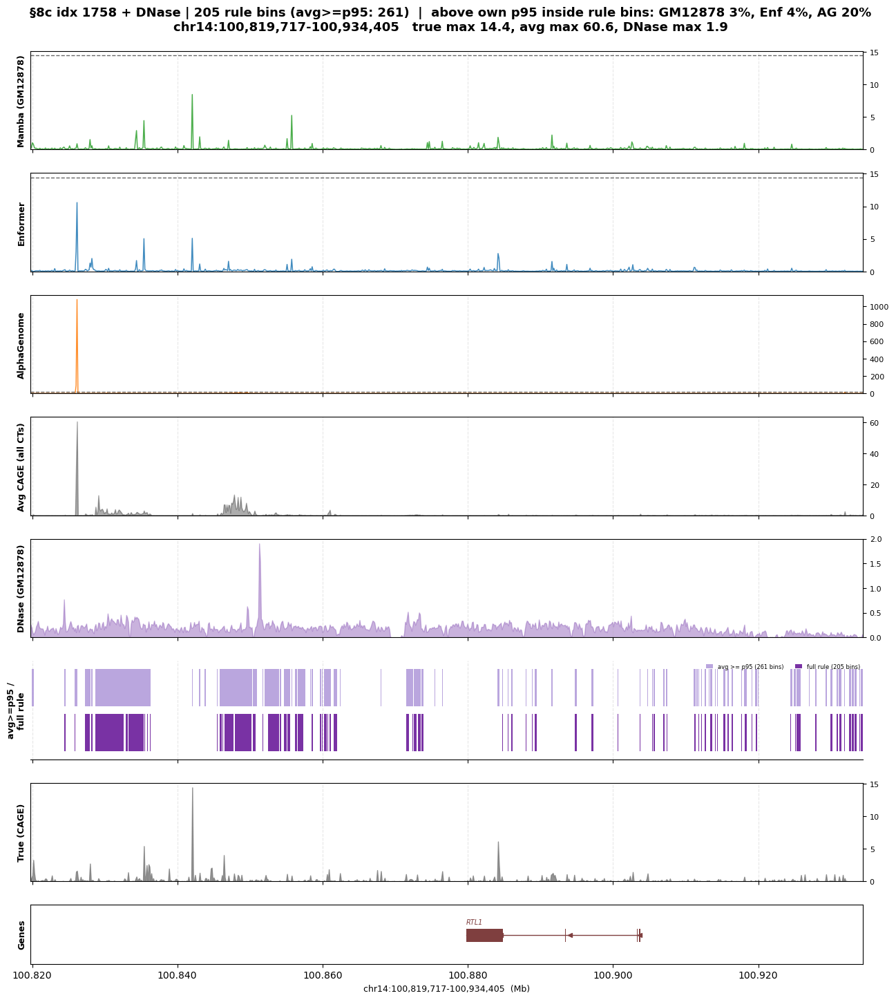

In [10]:
# §8c - the rank-1 region (idx 1758) exactly as in §8b, with a GM12878 DNase track added.
# GM12878_DNase.npz holds one bp-resolution coverage array per chromosome, shape (1, chrom_len),
# hg38. Mean-pool 128 bp -> 896 bins (same pooling comparing_model2 uses) so it lines up with CAGE.
DNASE_PATH = '/data1/lesliec/sarthak/data/DK_zarr/zarr_arrays/cell_type_arrays/GM12878_DNase.npz'
DNASE_COLOR = '#9467bd'

if '_dnase' not in globals():
    _dnase = np.load(DNASE_PATH)
    _dnase_cache = {}
    print(f'DNase npz loaded: {len(_dnase.files)} chromosomes')
else:
    print('DNase npz already loaded - skipped')


def _dnase_chrom(c):
    if c not in _dnase_cache:
        _dnase_cache[c] = np.asarray(_dnase[c][0], dtype=np.float32)
    return _dnase_cache[c]


def dnase_profile(idx):
    """Mean-pooled GM12878 DNase over the 896-bin predicted window for test region `idx`."""
    c, s, e = region_coords(idx)
    seg = _dnase_chrom(c)[s:e]
    if len(seg) < PRED_LEN:                      # pad if the window runs off the chromosome end
        seg = np.pad(seg, (0, PRED_LEN - len(seg)))
    return seg[:PRED_LEN].reshape(896, BIN).mean(axis=1)


idx = int(WORST[0])                              # rank 1 from §8a
chrom, start, end = region_coords(idx)
common = dict(chrom=chrom, start=start, bin_size=BIN)
tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k], color=COLORS[k], **common)
          for k in [mamba_key, enformer_key, ag_key]]
tracks.append(Track(AVG_ALL[idx], name='Avg CAGE (all CTs)', color='#111111',
                    style='fill', alpha=0.35, reference_exempt=True, **common))
dnase = dnase_profile(idx)
tracks.append(Track(dnase, name='DNase (GM12878)', color=DNASE_COLOR, style='fill',
                    alpha=0.5, reference_exempt=True, **common))
rule_slot = len(tracks)
tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill',
                    alpha=0.0, reference_exempt=True, **common))
truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)

m = RULE[idx]
frac = {}
for k in [mamba_key, enformer_key, ag_key]:
    pk = np.asarray(preds[k][idx])
    frac[k] = (pk[m] >= np.percentile(pk, 95)).mean()

title = (f'§8c idx {idx} + DNase | {RULE[idx].sum()} rule bins (avg>=p95: {C2[idx].sum()})  |  '
         f'above own p95 inside rule bins: GM12878 {frac[mamba_key]:.0%}, '
         f'Enf {frac[enformer_key]:.0%}, AG {frac[ag_key]:.0%}\n{chrom}:{start:,}-{end:,}   '
         f'true max {TRUE_ALL[idx].max():.1f}, avg max {AVG_ALL[idx].max():.1f}, '
         f'DNase max {dnase.max():.1f}')

fig, axes = plot_tracks(tracks, genes=ann, region=(chrom, start, end), ground_truth=truth,
                        collapse_genes=True, title=title,
                        figsize=(13, 1.6 * (len(tracks) + 2) + 1.7))
iv = draw_rule_track(axes[rule_slot], idx, (start, end))

# is DNase elevated where the rule fires? (rule bins are defined without DNase, so this is a check)
d95 = np.percentile(dnase, 95)
print(f'\nDNase: mean {dnase[m].mean():.3f} at rule bins vs {dnase[~m].mean():.3f} elsewhere '
      f'({dnase[m].mean() / dnase[~m].mean():.2f}x);  '
      f'{(dnase[m] >= d95).mean():.0%} of rule bins above its own p95 ({d95:.3f}) '
      f'vs {(dnase[~m] >= d95).mean():.0%} elsewhere')
print(f'{RULE[idx].sum()} rule bins in {len(iv)} run(s); longest '
      f'{max(b1 - b0 for b0, b1 in iv)} bins')
plt.show()

## 9. Quantifying the generic-expression failure without a PR curve

Per-bin AUPRC misses this failure mode twice over: it is **rank-based**, so AlphaGenome predicting
1100 where the truth is 2 costs it nothing, and it **averages over all recall levels**, so a handful
of top-ranked false peaks barely moves it. Four metrics that do capture it:

1. **Specificity contrast** `gap = R(pred, AVG) - R(pred, TRUE)` — both smoothed-log Pearson over the
   896 bins. No threshold and no peak calling, so there is nothing to tune. `gap > 0` means the
   prediction resembles generic cross-cell-type expression more than it resembles GM12878.
2. **Magnitude over-prediction** `log2((pred+1)/(true+1))` at the model's own top-k bins and at its
   single summit — the axis AUPRC discards entirely.
3. **precision@k** with `k` = the number of true peak bins, which looks only at the top of the
   ranking where false peaks live, instead of averaging the whole curve.
4. **Mechanism check**: of the model's *false* top-k bins, the fraction that are §8 rule bins.
   Against a global rule prevalence of 1.33%, this is an enrichment with a causal reading — the false
   peaks are not scattered, they sit on generically-expressed, GM12878-silent bins.

**The claim, and its shape.** Sorting regions by how many rule bins they contain (how far a window is
"generic but GM12878-silent"), `gap` *falls* for every model — so the effect is not "denser rule
regions look more generic". What separates the models is **how strongly each responds**: Mamba's gap
drops steeply as rule bins accumulate (Spearman rho ~ -0.53), i.e. the more generic-but-silent a
region gets, the more decisively Mamba describes the **GM12878** truth rather than the average.
Enformer responds about half as strongly (~ -0.33) and AlphaGenome is essentially **flat**
(~ -0.08, p ~ 0.06) — it keeps describing generic expression regardless. Meanwhile AlphaGenome's
magnitude error *grows* monotonically with rule density (median log2 excess +0.63 -> +2.18, i.e. up to
~4.5x too high).

Caveat: `AVG` and `TRUE` are themselves correlated (shared promoters), so `gap` is a contrast, not an
absolute — and all three models have positive gaps in rule-free regions, so "leans generic" is a
matter of degree, Mamba included.

In [11]:
# §9a - per-region metrics over every allowed region with >=3 true peak bins.
# Everything here is threshold-free except precision@k and the rule-enrichment check, which need
# the §8a label threshold THR_T (= global p95 of the true track).
from scipy.stats import spearmanr, wilcoxon

MODEL_KEYS = [mamba_key, enformer_key, ag_key]
RULE_COUNT = RULE.sum(axis=1)
K_MIN = 3                       # skip regions with too few true peaks for precision@k to mean anything

eligible = np.flatnonzero(allowed & ((TRUE_ALL >= THR_T).sum(axis=1) >= K_MIN))
print(f'{len(eligible)} of {allowed.sum()} allowed regions have >= {K_MIN} true peak bins')

cols = ['R_true', 'R_avg', 'gap', 'prec_at_k', 'log2_topk', 'log2_summit', 'fp_in_rule']
met = {k: {c: np.full(len(eligible), np.nan) for c in cols} for k in MODEL_KEYS}

for row, i in enumerate(tqdm(eligible, desc='§9 metrics')):
    tr, av, ru = TRUE_ALL[i], AVG_ALL[i], RULE[i]
    pos = tr >= THR_T
    k = int(pos.sum())
    for key in MODEL_KEYS:
        pr = np.asarray(preds[key][i], dtype=np.float64)
        topk = np.argsort(pr)[-k:]
        fp = topk[~pos[topk]]
        m = met[key]
        m['R_true'][row] = smoothed_log_pearson(pr, tr)
        m['R_avg'][row] = smoothed_log_pearson(pr, av)
        m['gap'][row] = m['R_avg'][row] - m['R_true'][row]
        m['prec_at_k'][row] = pos[topk].mean()
        m['log2_topk'][row] = np.median(np.log2((pr[topk] + 1) / (tr[topk] + 1)))
        j = int(np.argmax(pr))
        m['log2_summit'][row] = np.log2((pr[j] + 1) / (tr[j] + 1))
        if len(fp):
            m['fp_in_rule'][row] = ru[fp].mean()

RC_ELIG = RULE_COUNT[eligible]
RULE_PREV = float(RULE[allowed].mean())
print(f'global rule prevalence {RULE_PREV:.2%}\n')

print(f"{'':<16}{'R_true':>8}{'R_avg':>8}{'gap':>8}{'prec@k':>8}"
      f"{'log2_topk':>10}{'log2_sum':>9}{'FPinRule':>9}{'enrich':>8}")
for key in MODEL_KEYS:
    m = met[key]
    fr = np.nanmedian(m['fp_in_rule'])
    print(f'{PRETTY[key]:<16}' + ''.join(f'{np.nanmedian(m[c]):>8.3f}' for c in cols[:4])
          + f"{np.nanmedian(m['log2_topk']):>10.2f}{np.nanmedian(m['log2_summit']):>9.2f}"
          + f'{fr:>9.3f}{fr / RULE_PREV:>7.1f}x')

print('\ngap vs rule-bin count (the model-response claim):')
for key in MODEL_KEYS:
    g = met[key]['gap']
    ok = ~np.isnan(g)
    rho, pv = spearmanr(RC_ELIG[ok], g[ok])
    w = wilcoxon(g[ok])
    print(f'  {PRETTY[key]:<16} Spearman rho {rho:>+.3f} (p {pv:.1e})   '
          f'median gap {np.median(g[ok]):>+.3f}, Wilcoxon vs 0 p {w.pvalue:.1e}')

STRATA = [(0, 0), (1, 4), (5, 19), (20, 49), (50, 10 ** 9)]
STRATA_LAB = ['0', '1-4', '5-19', '20-49', '50+']
print(f"\n{'rule bins':>10}{'n':>6} | " + ' | '.join(f'{PRETTY[k]:>26}' for k in MODEL_KEYS))
print(f"{'':>10}{'':>6} | " + ' | '.join(f"{'gap':>8}{'prec@k':>8}{'log2sum':>9}" for _ in MODEL_KEYS))
strat_tab = {key: {c: [] for c in ['gap', 'prec_at_k', 'log2_summit']} for key in MODEL_KEYS}
for (lo, hi), lab in zip(STRATA, STRATA_LAB):
    sel = (RC_ELIG >= lo) & (RC_ELIG <= hi)
    line = f'{lab:>10}{sel.sum():>6} | '
    for key in MODEL_KEYS:
        vals = [np.nanmedian(met[key][c][sel]) for c in ['gap', 'prec_at_k', 'log2_summit']]
        for c, v in zip(['gap', 'prec_at_k', 'log2_summit'], vals):
            strat_tab[key][c].append(v)
        line += f'{vals[0]:>+8.3f}{vals[1]:>8.2f}{vals[2]:>+9.2f} | '
    print(line.rstrip(' |'))

MARK_IDX = int(WORST[0])                       # idx 1758, marked on every panel below
mark_row = int(np.flatnonzero(eligible == MARK_IDX)[0])
print(f'\nidx {MARK_IDX} ({RULE_COUNT[MARK_IDX]} rule bins) is row {mark_row}:')
for key in MODEL_KEYS:
    m = met[key]
    print(f'  {PRETTY[key]:<16} R_true {m["R_true"][mark_row]:>6.3f}  '
          f'R_avg {m["R_avg"][mark_row]:>6.3f}  gap {m["gap"][mark_row]:>+6.3f}  '
          f'prec@k {m["prec_at_k"][mark_row]:>5.2f}  FPinRule {m["fp_in_rule"][mark_row]:>5.2f}  '
          f'log2summit {m["log2_summit"][mark_row]:>+6.2f}')

1880 of 1883 allowed regions have >= 3 true peak bins


§9 metrics: 100%|██████████| 1880/1880 [00:11<00:00, 161.94it/s]


global rule prevalence 1.33%

                  R_true   R_avg     gap  prec@k log2_topk log2_sum FPinRule  enrich
Mamba (GM12878)    0.652   0.724   0.051   0.429      0.48     0.57    0.043    3.3x
Enformer           0.659   0.797   0.088   0.444      0.28     0.25    0.083    6.3x
AlphaGenome        0.459   0.646   0.079   0.244      1.43     2.94    0.110    8.2x

gap vs rule-bin count (the model-response claim):
  Mamba (GM12878)  Spearman rho -0.462 (p 8.3e-100)   median gap +0.051, Wilcoxon vs 0 p 6.9e-58
  Enformer         Spearman rho -0.304 (p 1.6e-41)   median gap +0.088, Wilcoxon vs 0 p 1.3e-144
  AlphaGenome      Spearman rho -0.009 (p 6.9e-01)   median gap +0.079, Wilcoxon vs 0 p 4.8e-109

 rule bins     n |            Mamba (GM12878) |                   Enformer |                AlphaGenome
                 |      gap  prec@k  log2sum |      gap  prec@k  log2sum |      gap  prec@k  log2sum
         0   324 |   +0.129    0.38    +0.59 |   +0.143    0.40    +0.14 |   +0.09

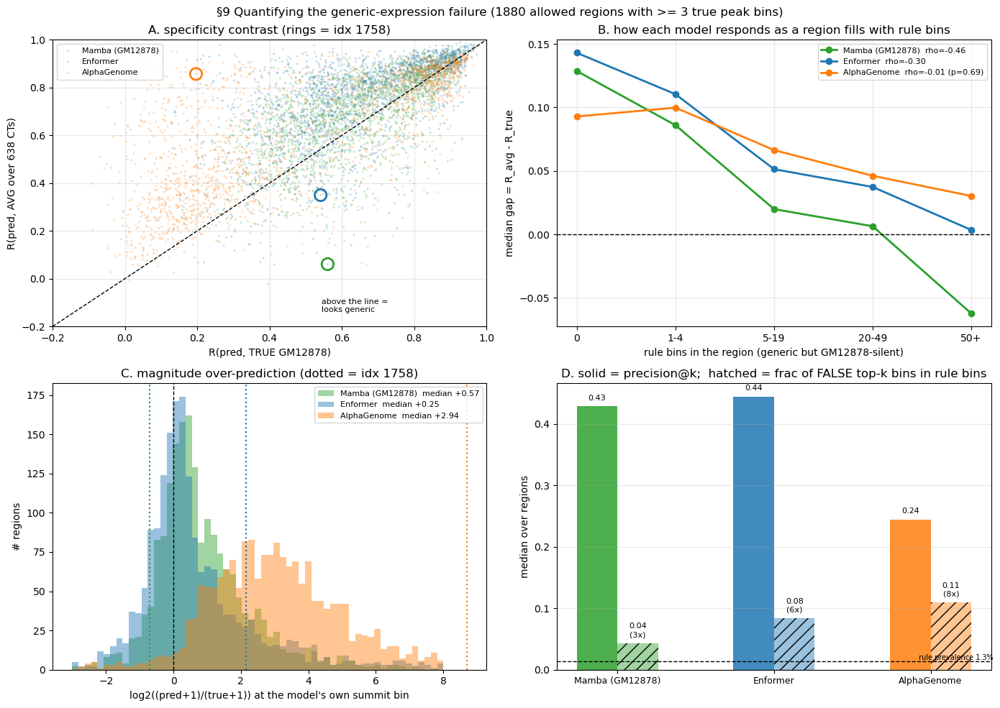

In [12]:
# §9b - the four metrics as one figure. idx 1758 is ringed on every panel so the anecdote from §8
# and the population it sits in are visible together.
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# --- A: does the prediction look like AVG or like TRUE? --------------------------
ax = axes[0, 0]
for key in MODEL_KEYS:
    m = met[key]
    ax.scatter(m['R_true'], m['R_avg'], s=5, alpha=0.25, color=COLORS[key], label=PRETTY[key],
               edgecolors='none')
    ax.scatter(m['R_true'][mark_row], m['R_avg'][mark_row], s=140, facecolors='none',
               edgecolors=COLORS[key], linewidths=2, zorder=5)
lim = [-0.2, 1.0]
ax.plot(lim, lim, color='k', lw=1, ls='--')
ax.text(0.62, 0.05, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.set_xlim(lim)
ax.set_ylim(lim)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel('R(pred, AVG over 638 CTs)')
ax.set_title(f'A. specificity contrast (rings = idx {MARK_IDX})')
ax.legend(fontsize=8, loc='upper left')
ax.grid(alpha=0.3)

# --- B: the model-response claim -------------------------------------------------
ax = axes[0, 1]
xs = np.arange(len(STRATA_LAB))
for key in MODEL_KEYS:
    g = met[key]['gap']
    ok = ~np.isnan(g)
    rho, pv = spearmanr(RC_ELIG[ok], g[ok])
    ax.plot(xs, strat_tab[key]['gap'], 'o-', color=COLORS[key], lw=2,
            label=f'{PRETTY[key]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels(STRATA_LAB)
ax.set_xlabel('rule bins in the region (generic but GM12878-silent)')
ax.set_ylabel('median gap = R_avg - R_true')
ax.set_title('B. how each model responds as a region fills with rule bins')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

# --- C: magnitude error at the model's own summit --------------------------------
ax = axes[1, 0]
bins = np.linspace(-3, 8, 60)
for key in MODEL_KEYS:
    v = met[key]['log2_summit']
    ax.hist(v[~np.isnan(v)], bins=bins, color=COLORS[key], alpha=0.45,
            label=f'{PRETTY[key]}  median {np.nanmedian(v):+.2f}')
    ax.axvline(met[key]['log2_summit'][mark_row], color=COLORS[key], ls=':', lw=1.6)
ax.axvline(0, color='k', lw=1, ls='--')
ax.set_xlabel('log2((pred+1)/(true+1)) at the model\'s own summit bin')
ax.set_ylabel('# regions')
ax.set_title(f'C. magnitude over-prediction (dotted = idx {MARK_IDX})')
ax.legend(fontsize=8)

# --- D: top-of-ranking precision, and where the misses land ----------------------
ax = axes[1, 1]
w = 0.26
for j, key in enumerate(MODEL_KEYS):
    pk = met[key]['prec_at_k']
    fr = met[key]['fp_in_rule']
    ax.bar(j - w / 2, np.nanmedian(pk), w, color=COLORS[key], alpha=0.85)
    ax.bar(j + w / 2, np.nanmedian(fr), w, color=COLORS[key], alpha=0.45, hatch='//')
    ax.text(j - w / 2, np.nanmedian(pk) + 0.01, f'{np.nanmedian(pk):.2f}', ha='center', fontsize=8)
    ax.text(j + w / 2, np.nanmedian(fr) + 0.01,
            f'{np.nanmedian(fr):.2f}\n({np.nanmedian(fr)/RULE_PREV:.0f}x)', ha='center', fontsize=8)
ax.axhline(RULE_PREV, color='k', lw=1, ls='--')
ax.text(2.4, RULE_PREV, f' rule prevalence {RULE_PREV:.1%}', fontsize=7, va='bottom', ha='right')
ax.set_xticks(range(len(MODEL_KEYS)))
ax.set_xticklabels([PRETTY[k] for k in MODEL_KEYS], fontsize=9)
ax.set_ylabel('median over regions')
ax.set_title('D. solid = precision@k;  hatched = frac of FALSE top-k bins in rule bins')
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§9 Quantifying the generic-expression failure ({len(eligible)} allowed regions '
             f'with >= {K_MIN} true peak bins)', fontsize=12)
fig.tight_layout()
plt.show()

## 10. Model accuracy as a function of how generic the region is

Same idea as §9B but with a **continuous, threshold-free** conditioning variable: instead of counting
rule bins, measure directly how similar the two targets are in each region.

- **x** = `R(TRUE GM12878, AVG over 638 CTs)` — a property of the *region*, not of any model, so all
  three models sit at the same x. Left (x -> 0) = the GM12878 target looks nothing like generic
  expression (cell-type-specific region); right (x -> 1) = target and average are nearly the same
  (generic region).
- **y**, first plot = `R(prediction, TRUE GM12878)` — the accuracy we care about.
- **y**, second plot = `R(prediction, AVG)` — how much the prediction resembles generic expression.

One point per region per model, no aggregation. Thick lines are per-model running medians over 12
equal-count x-bins; the legend gives each model's overall median y and its Spearman rho against x.
Rings mark idx 1758.

The first figure uses **raw Pearson** on the raw 896-bin values (CAGE is spiky, so single bins carry a
lot of weight); the second repeats it with the **smoothed-log Pearson** (log1p, Gaussian sigma=1.5)
used in §1-§9, so you can check the pattern is not an artifact of the transform.

In [13]:
# §10a - correlations per region. x is a target-vs-target correlation (no model involved);
# y is prediction-vs-target. Computed both raw and smoothed-log over the same regions as §9.
def raw_pearson(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    if a.std() < 1e-12 or b.std() < 1e-12:
        return np.nan
    return pearsonr(a, b)[0]


x_raw = np.full(len(eligible), np.nan)          # R(TRUE, AVG), raw
x_sm = np.full(len(eligible), np.nan)           # R(TRUE, AVG), smoothed-log
y_raw = {k: {'true': np.full(len(eligible), np.nan), 'avg': np.full(len(eligible), np.nan)}
         for k in MODEL_KEYS}

for row, i in enumerate(tqdm(eligible, desc='§10 correlations')):
    tr, av = TRUE_ALL[i], AVG_ALL[i]
    x_raw[row] = raw_pearson(tr, av)
    x_sm[row] = smoothed_log_pearson(tr, av)
    for key in MODEL_KEYS:
        pr = np.asarray(preds[key][i], dtype=np.float64)
        y_raw[key]['true'][row] = raw_pearson(pr, tr)
        y_raw[key]['avg'][row] = raw_pearson(pr, av)

# smoothed-log y values already computed in §9a
y_sm = {k: {'true': met[k]['R_true'], 'avg': met[k]['R_avg']} for k in MODEL_KEYS}

print(f'x = R(TRUE, AVG) over {len(eligible)} regions')
for nm, x in [('raw', x_raw), ('smoothed-log', x_sm)]:
    print(f'  {nm:<13} median {np.nanmedian(x):.3f}  '
          f'[{np.nanmin(x):.2f}, {np.nanmax(x):.2f}]  '
          f'{np.sum(x < 0)} regions below 0')

print('\nmedian y by x-tertile (raw Pearson):')
q1, q2 = np.nanpercentile(x_raw, [33.3, 66.7])
terts = [('specific  x<%.2f' % q1, x_raw < q1),
         ('middle', (x_raw >= q1) & (x_raw < q2)),
         ('generic   x>=%.2f' % q2, x_raw >= q2)]
print(f"{'tertile':<20}" + ''.join(f'{PRETTY[k]:>22}' for k in MODEL_KEYS))
print(f"{'':<20}" + ''.join(f"{'R_true':>11}{'R_avg':>11}" for _ in MODEL_KEYS))
for lab, sel in terts:
    print(f'{lab:<20}' + ''.join(
        f"{np.nanmedian(y_raw[k]['true'][sel]):>11.3f}{np.nanmedian(y_raw[k]['avg'][sel]):>11.3f}"
        for k in MODEL_KEYS))

print('\nSpearman(x, y) per model:')
for tag, x, y in [('raw', x_raw, y_raw), ('smoothed-log', x_sm, y_sm)]:
    for key in MODEL_KEYS:
        for which in ['true', 'avg']:
            ok = ~np.isnan(x) & ~np.isnan(y[key][which])
            rho, pv = spearmanr(x[ok], y[key][which][ok])
            print(f'  {tag:<13} {PRETTY[key]:<16} y=R(pred,{which.upper():<4}) '
                  f'rho {rho:>+.3f}  p {pv:.1e}')

§10 correlations: 100%|██████████| 1880/1880 [00:09<00:00, 192.68it/s]


x = R(TRUE, AVG) over 1880 regions
  raw           median 0.793  [0.00, 1.00]  0 regions below 0
  smoothed-log  median 0.719  [0.05, 0.99]  0 regions below 0

median y by x-tertile (raw Pearson):
tertile                    Mamba (GM12878)              Enformer           AlphaGenome
                         R_true      R_avg     R_true      R_avg     R_true      R_avg
specific  x<0.65          0.441      0.468      0.403      0.588      0.129      0.423
middle                    0.647      0.699      0.674      0.766      0.204      0.329
generic   x>=0.89         0.892      0.892      0.916      0.922      0.895      0.929

Spearman(x, y) per model:
  raw           Mamba (GM12878)  y=R(pred,TRUE) rho +0.582  p 7.4e-171
  raw           Mamba (GM12878)  y=R(pred,AVG ) rho +0.611  p 6.8e-193
  raw           Enformer         y=R(pred,TRUE) rho +0.671  p 1.2e-246
  raw           Enformer         y=R(pred,AVG ) rho +0.556  p 6.1e-153
  raw           AlphaGenome      y=R(pred,TRUE) rho +0.56

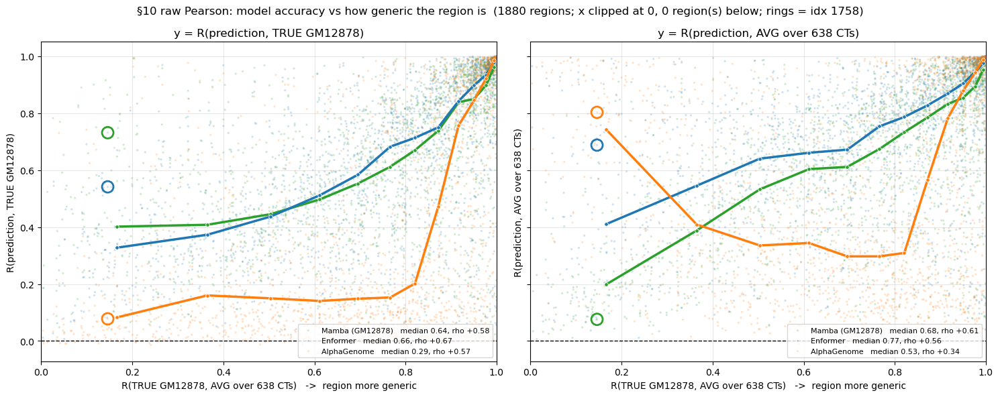

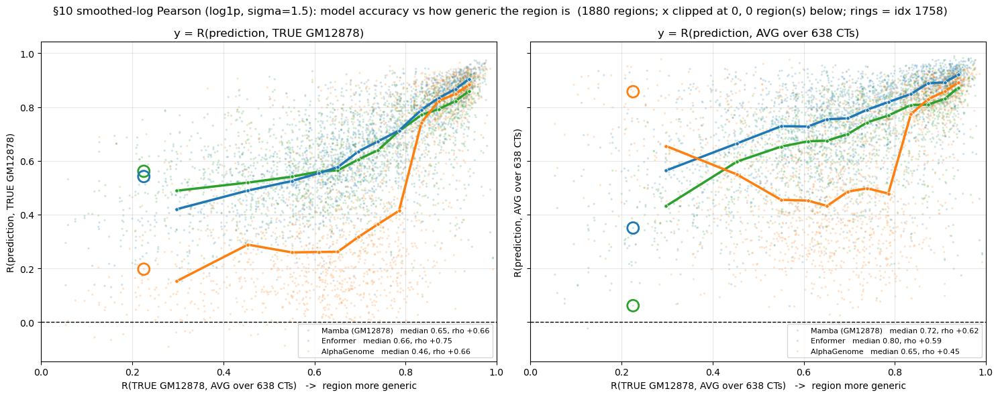

In [14]:
# §10b - the two plots, once per correlation flavour. Thick line = running median over 12
# equal-count x-bins (the per-model "average" overlaid on the raw scatter).
N_XBINS = 12


def running_median(x, y, nbins=N_XBINS):
    """Median y within equal-count x-bins -> (bin centre x, median y)."""
    ok = ~np.isnan(x) & ~np.isnan(y)
    xs, ys = x[ok], y[ok]
    edges = np.nanpercentile(xs, np.linspace(0, 100, nbins + 1))
    edges = np.unique(edges)
    cx, cy = [], []
    for a, b in zip(edges[:-1], edges[1:]):
        m = (xs >= a) & (xs <= b if b == edges[-1] else xs < b)
        if m.sum() >= 5:
            cx.append(np.median(xs[m]))
            cy.append(np.median(ys[m]))
    return np.array(cx), np.array(cy)


for tag, x, y in [('raw Pearson', x_raw, y_raw),
                  ('smoothed-log Pearson (log1p, sigma=1.5)', x_sm, y_sm)]:
    fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 'true', 'R(prediction, TRUE GM12878)'),
                            (axes[1], 'avg', 'R(prediction, AVG over 638 CTs)')]:
        for key in MODEL_KEYS:
            yy = y[key][which]
            ok = ~np.isnan(x) & ~np.isnan(yy)
            rho = spearmanr(x[ok], yy[ok])[0]
            ax.scatter(x, yy, s=5, alpha=0.22, color=COLORS[key], edgecolors='none',
                       label=f'{PRETTY[key]}   median {np.nanmedian(yy):.2f}, rho {rho:+.2f}')
            cx, cy = running_median(x, yy)
            ax.plot(cx, cy, '-o', color=COLORS[key], lw=2.5, ms=4,
                    markeredgecolor='white', markeredgewidth=0.6, zorder=6)
            ax.scatter(x[mark_row], yy[mark_row], s=150, facecolors='none',
                       edgecolors=COLORS[key], linewidths=2, zorder=7)
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        ax.set_xlabel('R(TRUE GM12878, AVG over 638 CTs)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}')
        ax.legend(fontsize=8, loc='lower right')
        ax.grid(alpha=0.3)
    n_off = int(np.sum(x < 0))
    fig.suptitle(f'§10 {tag}: model accuracy vs how generic the region is  '
                 f'({len(eligible)} regions; x clipped at 0, {n_off} region(s) below; '
                 f'rings = idx {MARK_IDX})', fontsize=12)
    fig.tight_layout()
    plt.show()

## 11. §8 repeated with the immune (8 cell type) model

`immune_CAGE_predictions.npy` is `(1937, 896, 1)` and its companion `immune_CAGE_targets.npy` is
**bit-identical** to `GM12878_base_targets_conv.npy` — so this is the GM12878 head of the 8-cell-type
model, directly comparable to everything above with no change to the target or the rule.

The §8 scan itself is **model-independent** (the rule uses only `TRUE` and `AVG`), so `RULE`, `C2` and
`WORST` are reused unchanged — only the track stack and the per-model enrichment table gain a row.

loaded immune_CAGE_predictions.npy: (1937, 896)
immune_CAGE_targets.npy == GM12878 target (verified)


rank 1 (idx 1758)  chr14:100,819,717  Mamba (GM12878) 3%  Mamba (immune) 3%  Enformer 4%  AlphaGenome 20%


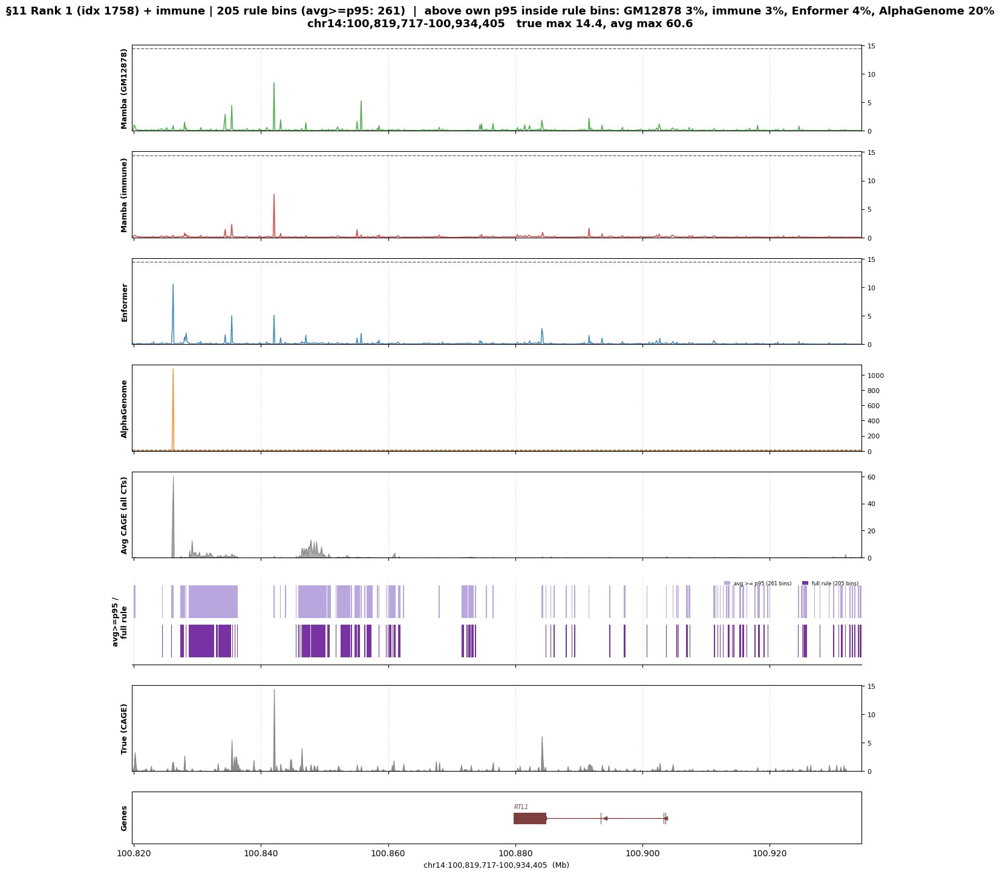

rank 2 (idx 1447)  chr11:35,197,431  Mamba (GM12878) 6%  Mamba (immune) 10%  Enformer 9%  AlphaGenome 12%


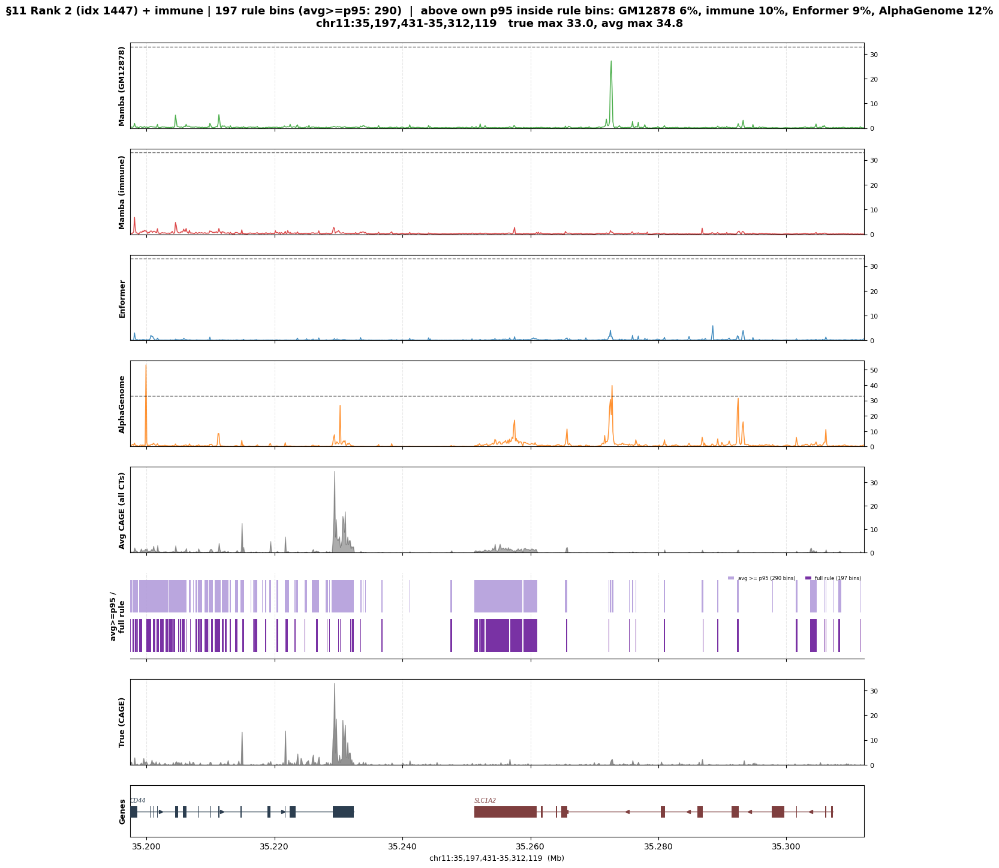

rank 3 (idx 1384)  chr15:25,005,401  Mamba (GM12878) 6%  Mamba (immune) 8%  Enformer 10%  AlphaGenome 11%


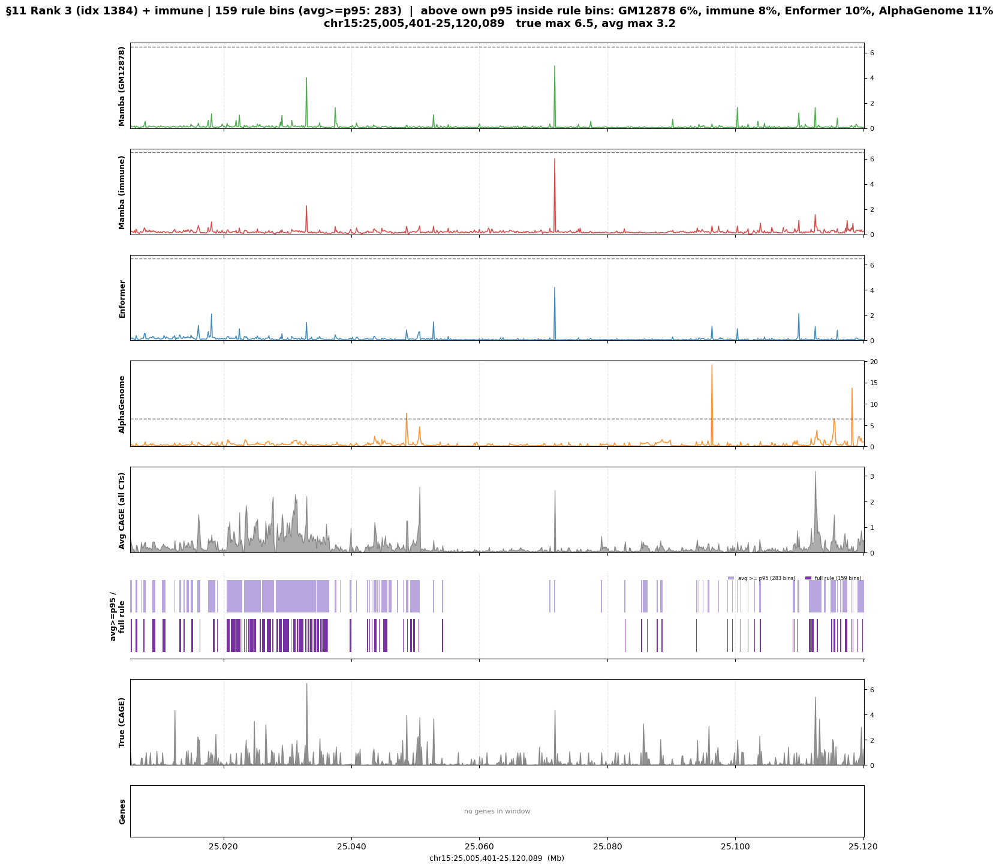

rank 4 (idx 1900)  chr11:35,082,742  Mamba (GM12878) 3%  Mamba (immune) 4%  Enformer 3%  AlphaGenome 3%


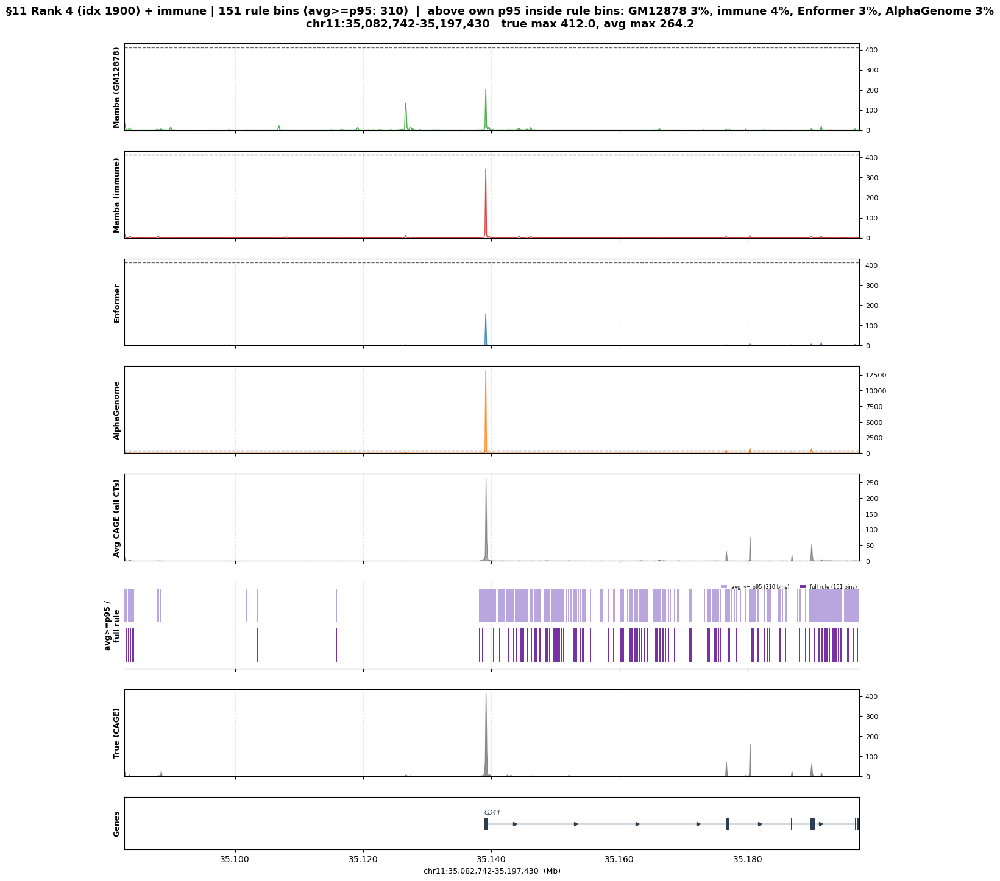

rank 5 (idx 1576)  chr3:188,870,350  Mamba (GM12878) 5%  Mamba (immune) 18%  Enformer 6%  AlphaGenome 29%


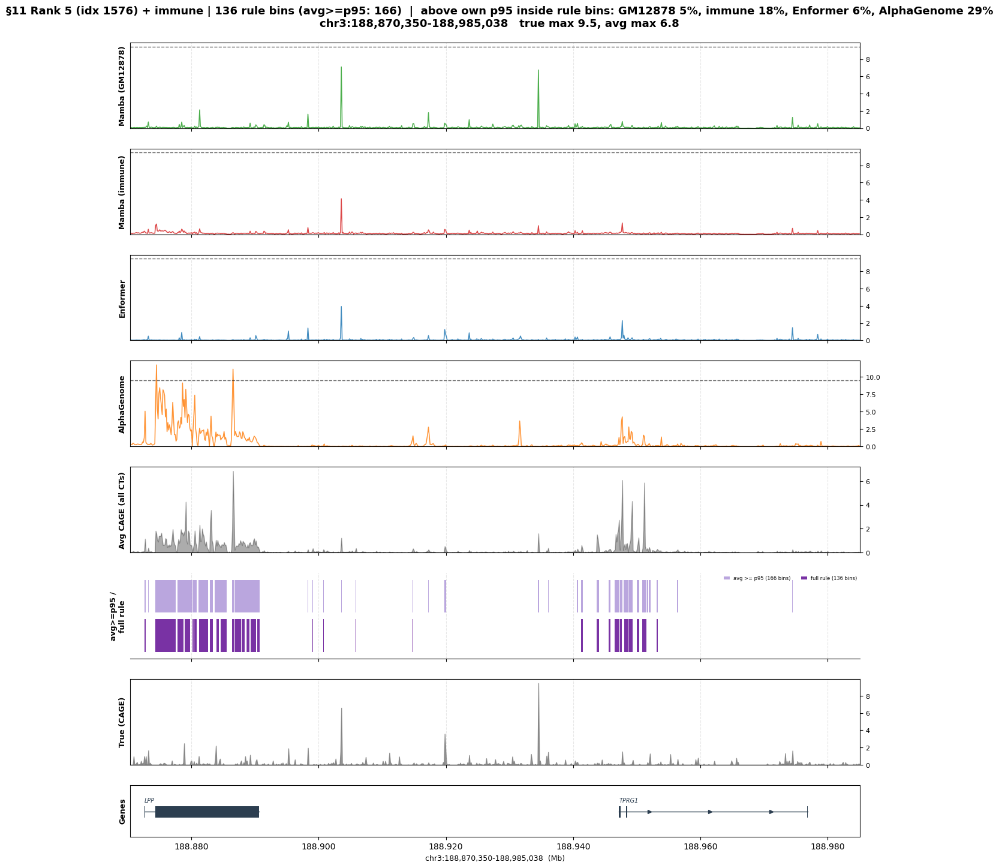

In [15]:
# §11 - the 5 worst regions from §8a, re-plotted with the immune model added as a 4th track.
IMMUNE_KEY = 'immune_CAGE_predictions.npy'

if IMMUNE_KEY not in preds:
    _im = np.load(f'{MODEL_OUT}/{IMMUNE_KEY}')
    preds[IMMUNE_KEY] = _im[:, :, 0] if _im.ndim == 3 else _im
    print(f'loaded {IMMUNE_KEY}: {preds[IMMUNE_KEY].shape}')
COLORS[IMMUNE_KEY] = '#d62728'
PRETTY[IMMUNE_KEY] = 'Mamba (immune)'

# the immune file ships its own target; assert it is the GM12878 target before comparing
_imt = np.load(f'{MODEL_OUT}/immune_CAGE_targets.npy')
_imt = _imt[:, :, 0] if _imt.ndim == 3 else _imt
assert np.allclose(np.asarray(_imt, dtype=np.float32), TRUE_ALL), \
    'immune_CAGE_targets.npy is NOT the GM12878 target - the comparison below would be invalid'
print('immune_CAGE_targets.npy == GM12878 target (verified)')

MODEL_KEYS_IM = [mamba_key, IMMUNE_KEY, enformer_key, ag_key]

for rank, idx in enumerate(WORST):
    chrom, start, end = region_coords(idx)
    common = dict(chrom=chrom, start=start, bin_size=BIN)
    tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k], color=COLORS[k], **common)
              for k in MODEL_KEYS_IM]
    tracks.append(Track(AVG_ALL[idx], name='Avg CAGE (all CTs)', color='#111111',
                        style='fill', alpha=0.35, reference_exempt=True, **common))
    rule_slot = len(tracks)
    tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill',
                        alpha=0.0, reference_exempt=True, **common))
    truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)

    m = RULE[idx]
    frac = {k: (np.asarray(preds[k][idx])[m]
                >= np.percentile(np.asarray(preds[k][idx]), 95)).mean() for k in MODEL_KEYS_IM}
    title = (f'§11 Rank {rank+1} (idx {idx}) + immune | {RULE[idx].sum()} rule bins '
             f'(avg>=p95: {C2[idx].sum()})  |  above own p95 inside rule bins: '
             + ', '.join(f'{PRETTY[k].split()[-1].strip("()")} {frac[k]:.0%}' for k in MODEL_KEYS_IM)
             + f'\n{chrom}:{start:,}-{end:,}   true max {TRUE_ALL[idx].max():.1f}, '
               f'avg max {AVG_ALL[idx].max():.1f}')

    fig, axes = plot_tracks(tracks, genes=ann, region=(chrom, start, end), ground_truth=truth,
                            collapse_genes=True, title=title,
                            figsize=(13, 1.6 * (len(tracks) + 2) + 1.7))
    draw_rule_track(axes[rule_slot], idx, (start, end))
    print(f'rank {rank+1} (idx {idx})  {chrom}:{start:,}  ' +
          '  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in MODEL_KEYS_IM))
    plt.show()

## 12. §9 repeated with the immune model

Same four metrics — specificity contrast `gap = R_avg - R_true`, magnitude over-prediction,
precision@k, and the rule-enrichment of each model's false top-k bins — with the immune model added.
Only the immune column is computed here; the other three are reused from §9a.

In [16]:
# §12a - extend the §9a metric table with the immune model, then reprint every summary with 4 models.
if IMMUNE_KEY not in met:
    met[IMMUNE_KEY] = {c: np.full(len(eligible), np.nan) for c in cols}
    for row, i in enumerate(tqdm(eligible, desc='§12 immune metrics')):
        tr, av, ru = TRUE_ALL[i], AVG_ALL[i], RULE[i]
        pos = tr >= THR_T
        k = int(pos.sum())
        pr = np.asarray(preds[IMMUNE_KEY][i], dtype=np.float64)
        topk = np.argsort(pr)[-k:]
        fp = topk[~pos[topk]]
        m = met[IMMUNE_KEY]
        m['R_true'][row] = smoothed_log_pearson(pr, tr)
        m['R_avg'][row] = smoothed_log_pearson(pr, av)
        m['gap'][row] = m['R_avg'][row] - m['R_true'][row]
        m['prec_at_k'][row] = pos[topk].mean()
        m['log2_topk'][row] = np.median(np.log2((pr[topk] + 1) / (tr[topk] + 1)))
        j = int(np.argmax(pr))
        m['log2_summit'][row] = np.log2((pr[j] + 1) / (tr[j] + 1))
        if len(fp):
            m['fp_in_rule'][row] = ru[fp].mean()
else:
    print('immune metrics already computed - skipped')

print(f"\n{'':<16}{'R_true':>8}{'R_avg':>8}{'gap':>8}{'prec@k':>8}"
      f"{'log2_topk':>10}{'log2_sum':>9}{'FPinRule':>9}{'enrich':>8}")
for key in MODEL_KEYS_IM:
    m = met[key]
    fr = np.nanmedian(m['fp_in_rule'])
    print(f'{PRETTY[key]:<16}' + ''.join(f'{np.nanmedian(m[c]):>8.3f}' for c in cols[:4])
          + f"{np.nanmedian(m['log2_topk']):>10.2f}{np.nanmedian(m['log2_summit']):>9.2f}"
          + f'{fr:>9.3f}{fr / RULE_PREV:>7.1f}x')

print('\ngap vs rule-bin count (the model-response claim):')
for key in MODEL_KEYS_IM:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    print(f'  {PRETTY[key]:<16} Spearman rho {rho:>+.3f} (p {pv:.1e})   '
          f'median gap {np.median(g_[ok]):>+.3f}')

# stratified table, transposed (rows = model) so 4 models stay readable
strat_tab = {key: {c: [] for c in ['gap', 'prec_at_k', 'log2_summit']} for key in MODEL_KEYS_IM}
for (lo, hi) in STRATA:
    sel = (RC_ELIG >= lo) & (RC_ELIG <= hi)
    for key in MODEL_KEYS_IM:
        for c in ['gap', 'prec_at_k', 'log2_summit']:
            strat_tab[key][c].append(np.nanmedian(met[key][c][sel]))
for c, lab in [('gap', 'median gap = R_avg - R_true'), ('prec_at_k', 'median precision@k'),
               ('log2_summit', 'median log2 excess at summit')]:
    print(f'\n{lab}  (columns = rule bins per region)')
    print(f"{'':<16}" + ''.join(f'{s:>10}' for s in STRATA_LAB))
    for key in MODEL_KEYS_IM:
        print(f'{PRETTY[key]:<16}' + ''.join(f'{v:>+10.3f}' for v in strat_tab[key][c]))

print(f'\nidx {MARK_IDX}:')
for key in MODEL_KEYS_IM:
    m = met[key]
    print(f'  {PRETTY[key]:<16} R_true {m["R_true"][mark_row]:>6.3f}  '
          f'R_avg {m["R_avg"][mark_row]:>6.3f}  gap {m["gap"][mark_row]:>+6.3f}  '
          f'prec@k {m["prec_at_k"][mark_row]:>5.2f}  FPinRule {m["fp_in_rule"][mark_row]:>5.2f}  '
          f'log2summit {m["log2_summit"][mark_row]:>+6.2f}')

§12 immune metrics: 100%|██████████| 1880/1880 [00:03<00:00, 587.40it/s]



                  R_true   R_avg     gap  prec@k log2_topk log2_sum FPinRule  enrich
Mamba (GM12878)    0.652   0.724   0.051   0.429      0.48     0.57    0.043    3.3x
Mamba (immune)     0.640   0.777   0.092   0.419      0.10    -0.02    0.077    5.8x
Enformer           0.659   0.797   0.088   0.444      0.28     0.25    0.083    6.3x
AlphaGenome        0.459   0.646   0.079   0.244      1.43     2.94    0.110    8.2x

gap vs rule-bin count (the model-response claim):
  Mamba (GM12878)  Spearman rho -0.462 (p 8.3e-100)   median gap +0.051
  Mamba (immune)   Spearman rho -0.349 (p 4.9e-55)   median gap +0.092
  Enformer         Spearman rho -0.304 (p 1.6e-41)   median gap +0.088
  AlphaGenome      Spearman rho -0.009 (p 6.9e-01)   median gap +0.079

median gap = R_avg - R_true  (columns = rule bins per region)
                         0       1-4      5-19     20-49       50+
Mamba (GM12878)     +0.129    +0.086    +0.020    +0.006    -0.062
Mamba (immune)      +0.169    +0.125    +

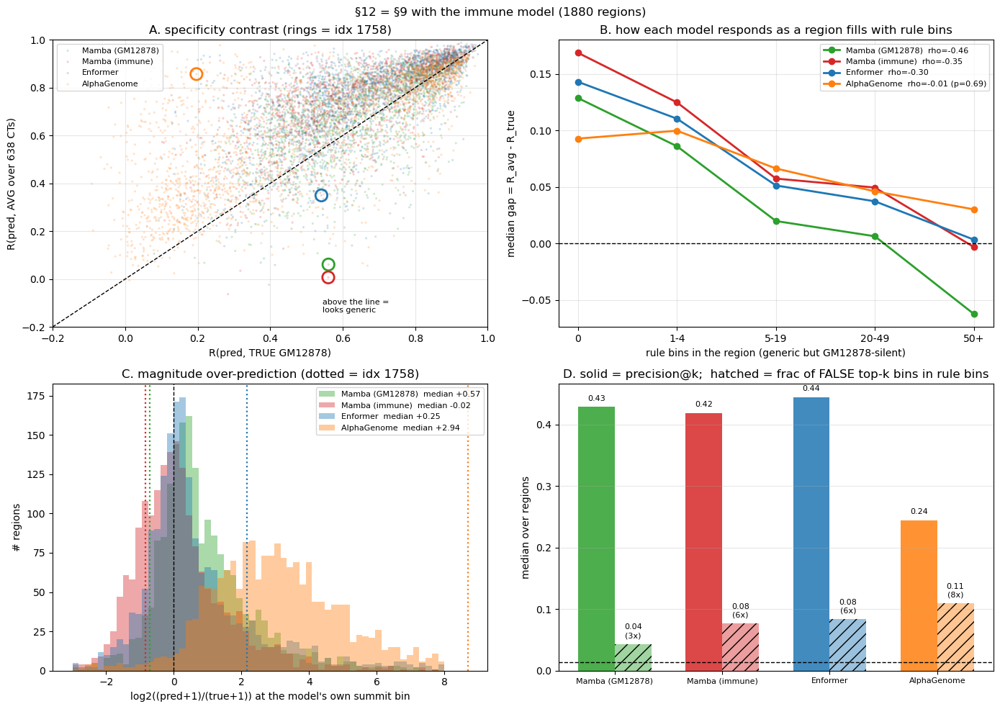

In [17]:
# §12b - the §9b figure with 4 models.
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

ax = axes[0, 0]
for key in MODEL_KEYS_IM:
    m = met[key]
    ax.scatter(m['R_true'], m['R_avg'], s=5, alpha=0.22, color=COLORS[key], label=PRETTY[key],
               edgecolors='none')
    ax.scatter(m['R_true'][mark_row], m['R_avg'][mark_row], s=140, facecolors='none',
               edgecolors=COLORS[key], linewidths=2, zorder=5)
ax.plot([-0.2, 1.0], [-0.2, 1.0], color='k', lw=1, ls='--')
ax.text(0.62, 0.05, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.set_xlim(-0.2, 1.0)
ax.set_ylim(-0.2, 1.0)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel('R(pred, AVG over 638 CTs)')
ax.set_title(f'A. specificity contrast (rings = idx {MARK_IDX})')
ax.legend(fontsize=8, loc='upper left')
ax.grid(alpha=0.3)

ax = axes[0, 1]
xs = np.arange(len(STRATA_LAB))
for key in MODEL_KEYS_IM:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    ax.plot(xs, strat_tab[key]['gap'], 'o-', color=COLORS[key], lw=2,
            label=f'{PRETTY[key]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels(STRATA_LAB)
ax.set_xlabel('rule bins in the region (generic but GM12878-silent)')
ax.set_ylabel('median gap = R_avg - R_true')
ax.set_title('B. how each model responds as a region fills with rule bins')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

ax = axes[1, 0]
bins = np.linspace(-3, 8, 60)
for key in MODEL_KEYS_IM:
    v = met[key]['log2_summit']
    ax.hist(v[~np.isnan(v)], bins=bins, color=COLORS[key], alpha=0.40,
            label=f'{PRETTY[key]}  median {np.nanmedian(v):+.2f}')
    ax.axvline(met[key]['log2_summit'][mark_row], color=COLORS[key], ls=':', lw=1.6)
ax.axvline(0, color='k', lw=1, ls='--')
ax.set_xlabel('log2((pred+1)/(true+1)) at the model\'s own summit bin')
ax.set_ylabel('# regions')
ax.set_title(f'C. magnitude over-prediction (dotted = idx {MARK_IDX})')
ax.legend(fontsize=8)

ax = axes[1, 1]
w = 0.34
for j, key in enumerate(MODEL_KEYS_IM):
    pk = np.nanmedian(met[key]['prec_at_k'])
    fr = np.nanmedian(met[key]['fp_in_rule'])
    ax.bar(j - w / 2, pk, w, color=COLORS[key], alpha=0.85)
    ax.bar(j + w / 2, fr, w, color=COLORS[key], alpha=0.45, hatch='//')
    ax.text(j - w / 2, pk + 0.01, f'{pk:.2f}', ha='center', fontsize=8)
    ax.text(j + w / 2, fr + 0.01, f'{fr:.2f}\n({fr/RULE_PREV:.0f}x)', ha='center', fontsize=8)
ax.axhline(RULE_PREV, color='k', lw=1, ls='--')
ax.set_xticks(range(len(MODEL_KEYS_IM)))
ax.set_xticklabels([PRETTY[k] for k in MODEL_KEYS_IM], fontsize=8)
ax.set_ylabel('median over regions')
ax.set_title('D. solid = precision@k;  hatched = frac of FALSE top-k bins in rule bins')
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§12 = §9 with the immune model ({len(eligible)} regions)', fontsize=12)
fig.tight_layout()
plt.show()

## 13. §10 repeated with the immune model

x = `R(TRUE GM12878, AVG)` per region (unchanged, model-independent); y = `R(pred, TRUE)` then
`R(pred, AVG)`, now with four models. Raw Pearson first, smoothed-log second.

§13 immune correlations: 100%|██████████| 1880/1880 [00:02<00:00, 815.53it/s]


median y by x-tertile (raw Pearson):
tertile                    Mamba (GM12878)        Mamba (immune)              Enformer           AlphaGenome
                         R_true      R_avg     R_true      R_avg     R_true      R_avg     R_true      R_avg
specific  x<0.65          0.441      0.468      0.415      0.547      0.403      0.588      0.129      0.423
middle                    0.647      0.699      0.647      0.746      0.674      0.766      0.204      0.329
generic   x>=0.89         0.892      0.892      0.903      0.905      0.916      0.922      0.895      0.929


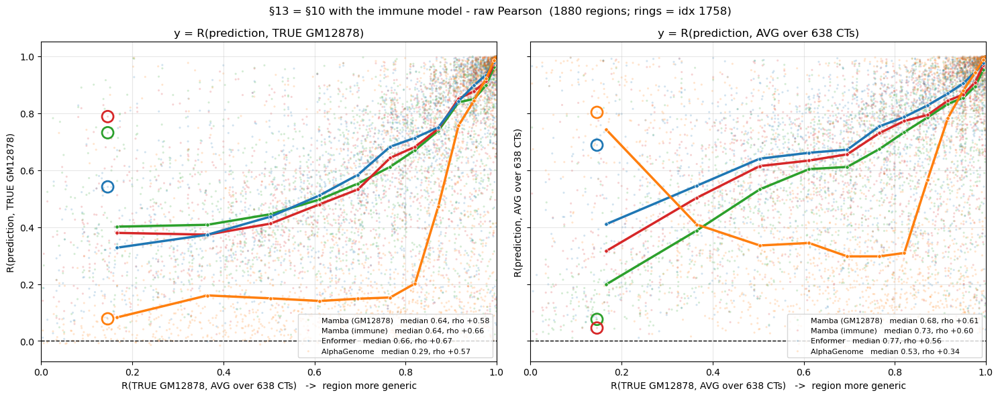

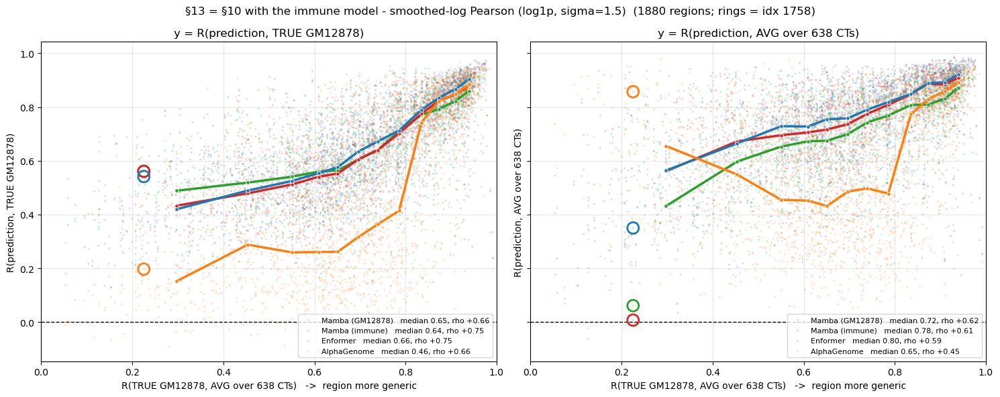

In [18]:
# §13 - §10 with the immune model added.
if IMMUNE_KEY not in y_raw:
    y_raw[IMMUNE_KEY] = {'true': np.full(len(eligible), np.nan),
                         'avg': np.full(len(eligible), np.nan)}
    for row, i in enumerate(tqdm(eligible, desc='§13 immune correlations')):
        pr = np.asarray(preds[IMMUNE_KEY][i], dtype=np.float64)
        y_raw[IMMUNE_KEY]['true'][row] = raw_pearson(pr, TRUE_ALL[i])
        y_raw[IMMUNE_KEY]['avg'][row] = raw_pearson(pr, AVG_ALL[i])
else:
    print('immune raw correlations already computed - skipped')
y_sm[IMMUNE_KEY] = {'true': met[IMMUNE_KEY]['R_true'], 'avg': met[IMMUNE_KEY]['R_avg']}

print('median y by x-tertile (raw Pearson):')
print(f"{'tertile':<20}" + ''.join(f'{PRETTY[k]:>22}' for k in MODEL_KEYS_IM))
print(f"{'':<20}" + ''.join(f"{'R_true':>11}{'R_avg':>11}" for _ in MODEL_KEYS_IM))
for lab, sel in terts:
    print(f'{lab:<20}' + ''.join(
        f"{np.nanmedian(y_raw[k]['true'][sel]):>11.3f}{np.nanmedian(y_raw[k]['avg'][sel]):>11.3f}"
        for k in MODEL_KEYS_IM))

for tag, x, y in [('raw Pearson', x_raw, y_raw),
                  ('smoothed-log Pearson (log1p, sigma=1.5)', x_sm, y_sm)]:
    fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 'true', 'R(prediction, TRUE GM12878)'),
                            (axes[1], 'avg', 'R(prediction, AVG over 638 CTs)')]:
        for key in MODEL_KEYS_IM:
            yy = y[key][which]
            ok = ~np.isnan(x) & ~np.isnan(yy)
            rho = spearmanr(x[ok], yy[ok])[0]
            ax.scatter(x, yy, s=5, alpha=0.20, color=COLORS[key], edgecolors='none',
                       label=f'{PRETTY[key]}   median {np.nanmedian(yy):.2f}, rho {rho:+.2f}')
            cx, cy = running_median(x, yy)
            ax.plot(cx, cy, '-o', color=COLORS[key], lw=2.5, ms=4,
                    markeredgecolor='white', markeredgewidth=0.6, zorder=6)
            ax.scatter(x[mark_row], yy[mark_row], s=150, facecolors='none',
                       edgecolors=COLORS[key], linewidths=2, zorder=7)
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        ax.set_xlabel('R(TRUE GM12878, AVG over 638 CTs)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}')
        ax.legend(fontsize=8, loc='lower right')
        ax.grid(alpha=0.3)
    fig.suptitle(f'§13 = §10 with the immune model - {tag}  ({len(eligible)} regions; '
                 f'rings = idx {MARK_IDX})', fontsize=12)
    fig.tight_layout()
    plt.show()

## 14. The retrained 1-cell-type Enformer: target verification

`model_out/enformer_retrained_gm12878/` holds an Enformer retrained on a **single** cell type
(`training_config.json`: `num_cell_types: 1`, `cell_types: ["GM12878"]`, target indices
`[12, 5110]` = DNase + CAGE). Only the **CAGE** output is used below; DNase and the 2-column
combined file are ignored.

This cell **hard-asserts** that `enformer_retrained_gm12878_cage_targets.npy` matches the target
every other model in this notebook is scored against. If it ever stops matching, execution stops
here rather than producing a silently invalid comparison.

In [19]:
# §14 - load the retrained 1-cell-type Enformer CAGE predictions, after verifying its targets are
# the same array every other model is scored against. A mismatch raises AssertionError.
import json

RETRAIN_DIR = f'{MODEL_OUT}/enformer_retrained_gm12878'
RETRAIN_KEY = 'enformer_retrained_gm12878_cage_predictions.npy'

_cfg = json.load(open(f'{RETRAIN_DIR}/training_config.json'))
_meta = json.load(open(f'{RETRAIN_DIR}/enformer_retrained_gm12878_cage_meta.json'))
print(f"training_config: num_cell_types={_cfg['num_cell_types']}, cell_types={_cfg['cell_types']}")
print(f"cage_meta: target_indices={_meta['target_indices']}, "
      f"model_cell_types={_meta['model_cell_types']}, reported r={_meta['mean_pearson_r']:.6f}")

_rt_targ = np.load(f'{RETRAIN_DIR}/enformer_retrained_gm12878_cage_targets.npy')
_ref = np.asarray(t1)

assert _rt_targ.shape == _ref.shape, (
    f'GATE FAILED: retrained CAGE targets are {_rt_targ.shape}, notebook target is {_ref.shape}')
_exact = np.array_equal(_rt_targ, _ref)
_close = np.allclose(_rt_targ, _ref, rtol=1e-5, atol=1e-6)
_maxdiff = float(np.abs(_rt_targ - _ref).max())
assert _exact or _close, (
    f'GATE FAILED: retrained CAGE targets differ from GM12878_base_targets_conv.npy '
    f'(max|diff| = {_maxdiff:.6g}). Stopping - a comparison against a different target '
    f'would be invalid.')
print(f'\nTARGET GATE PASSED: exact={_exact}, allclose={_close}, max|diff|={_maxdiff:.6g}')
print(f'  meta target index {_meta["target_indices"]} == the CAGE track 5110 used throughout')

preds[RETRAIN_KEY] = np.load(f'{RETRAIN_DIR}/{RETRAIN_KEY}')
assert preds[RETRAIN_KEY].shape == _ref.shape, preds[RETRAIN_KEY].shape
COLORS[RETRAIN_KEY] = '#08519c'                       # dark navy: an Enformer variant
PRETTY[RETRAIN_KEY] = 'Enformer (retrained, 1 CT)'
print(f'loaded {RETRAIN_KEY}: {preds[RETRAIN_KEY].shape}, '
      f'range [{preds[RETRAIN_KEY].min():.4f}, {preds[RETRAIN_KEY].max():.1f}]')

# the 4-model line-up used by §17-§19: retrained Enformer in place of the immune model
MODEL_KEYS_RE = [mamba_key, RETRAIN_KEY, enformer_key, ag_key]

# the CAGE-only file and column 1 of the 2-column file agree to float noise (r = 1.00000000,
# mean|diff| 4e-8); the CAGE-specific file is the one used here.

training_config: num_cell_types=1, cell_types=['GM12878']
cage_meta: target_indices=[5110], model_cell_types=['GM12878'], reported r=0.642478

TARGET GATE PASSED: exact=True, allclose=True, max|diff|=0
  meta target index [5110] == the CAGE track 5110 used throughout
loaded enformer_retrained_gm12878_cage_predictions.npy: (1937, 896), range [0.0014, 480.4]


## 15. Boxplot across all models (from `comparing_model.ipynb` §30/§31)

The original boxplot with the retrained 1-cell-type Enformer added as a sixth model. Both metrics:
smoothed-log Pearson (log1p + Gaussian sigma=1.5) and plain per-bin Pearson. Regions where a model's
profile is flat (undefined correlation) are dropped per model; the bold number is the **mean**, the
black bar the median.

smooth Enformer: 100%|██████████| 1937/1937 [00:01<00:00, 1212.15it/s]


smooth Enformer (retrained, 1 CT): 100%|██████████| 1937/1937 [00:01<00:00, 1367.13it/s]


smooth Mamba (GM12878): 100%|██████████| 1937/1937 [00:01<00:00, 1374.14it/s]


smooth Mamba (immune): 100%|██████████| 1937/1937 [00:01<00:00, 1301.75it/s]


smooth Mamba (No-pretrain): 100%|██████████| 1937/1937 [00:01<00:00, 1376.75it/s]


smooth AlphaGenome: 100%|██████████| 1937/1937 [00:01<00:00, 1270.47it/s]



model                           mean smooth   median  mean plain   median   nan
Enformer                              0.651    0.658       0.626    0.662     0
Enformer (retrained, 1 CT)            0.527    0.525       0.512    0.504     0
Mamba (GM12878)                       0.641    0.650       0.622    0.641     0
Mamba (immune)                        0.636    0.638       0.626    0.637     0
Mamba (No-pretrain)                   0.624    0.634       0.603    0.605     0
AlphaGenome                           0.483    0.453       0.428    0.284     0


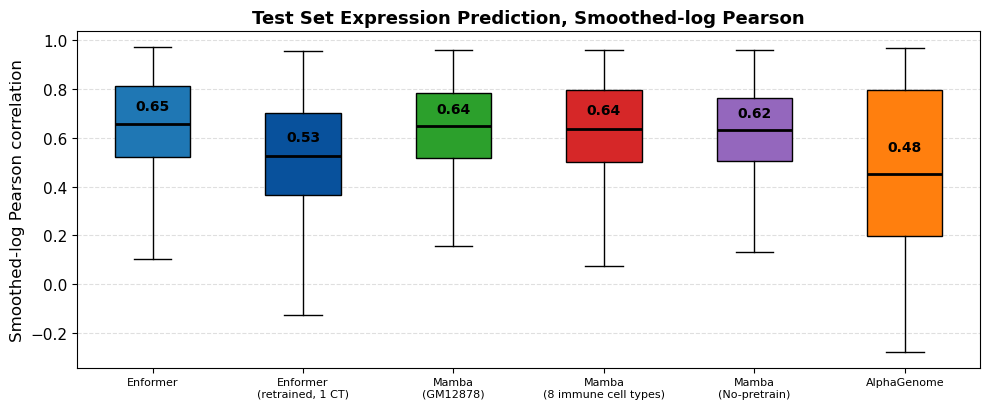

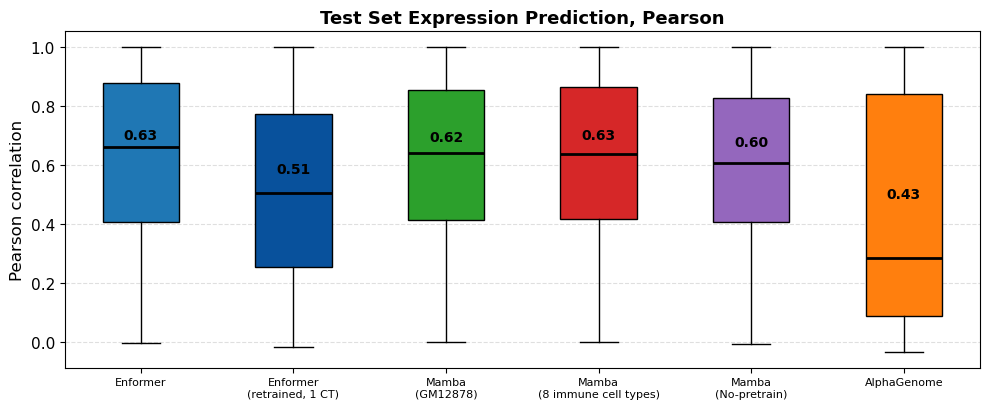

In [20]:
# §15 - recreate comparing_model.ipynb's boxplots with the retrained Enformer added.
NOPRETRAIN_KEY = 'nopretrain_predictions.npy'
if NOPRETRAIN_KEY not in preds:
    _np_ = np.load(f'{MODEL_OUT}/{NOPRETRAIN_KEY}')
    preds[NOPRETRAIN_KEY] = _np_[:, :, 0] if _np_.ndim == 3 else _np_
COLORS[NOPRETRAIN_KEY] = '#9467bd'
PRETTY[NOPRETRAIN_KEY] = 'Mamba (No-pretrain)'
if IMMUNE_KEY not in preds:                      # §11 normally loads this
    _im_ = np.load(f'{MODEL_OUT}/{IMMUNE_KEY}')
    preds[IMMUNE_KEY] = _im_[:, :, 0] if _im_.ndim == 3 else _im_
    COLORS[IMMUNE_KEY], PRETTY[IMMUNE_KEY] = '#d62728', 'Mamba (immune)'

BOX_KEYS = [enformer_key, RETRAIN_KEY, mamba_key, IMMUNE_KEY, NOPRETRAIN_KEY, ag_key]
BOX_LABELS = ['Enformer', 'Enformer\n(retrained, 1 CT)', 'Mamba\n(GM12878)',
              'Mamba\n(8 immune cell types)', 'Mamba\n(No-pretrain)', 'AlphaGenome']

# per-region scores under both metrics for every model in the boxplot
if 'box_smooth' not in globals():
    box_smooth, box_plain = {}, {}
    for k in BOX_KEYS:
        arr = preds[k]
        assert arr.shape == t1.shape, f'{k} vs t1 shape mismatch'
        box_smooth[k] = np.array([smoothed_log_pearson(arr[i], t1[i])
                                  for i in tqdm(range(arr.shape[0]), desc=f'smooth {PRETTY[k]}')])
        box_plain[k] = np.array([raw_pearson(arr[i], t1[i]) for i in range(arr.shape[0])])
else:
    print('box scores already in memory - skipped')

print(f"\n{'model':<30}{'mean smooth':>13}{'median':>9}{'mean plain':>12}{'median':>9}{'nan':>6}")
for k in BOX_KEYS:
    s, pl = box_smooth[k], box_plain[k]
    print(f'{PRETTY[k]:<30}{np.nanmean(s):>13.3f}{np.nanmedian(s):>9.3f}'
          f'{np.nanmean(pl):>12.3f}{np.nanmedian(pl):>9.3f}{int(np.isnan(s).sum()):>6}')

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    data = [res[k][~np.isnan(res[k])] for k in BOX_KEYS]
    plt.figure(figsize=(10, 4.2))
    box = plt.boxplot(data, labels=BOX_LABELS, showfliers=False, patch_artist=True,
                      boxprops=dict(edgecolor='black'),
                      medianprops=dict(color='black', linewidth=2),
                      whiskerprops=dict(color='black'), capprops=dict(color='black'))
    for patch, k in zip(box['boxes'], BOX_KEYS):
        patch.set_facecolor(COLORS[k])
    for i, vals in enumerate(data):
        plt.text(i + 1, np.mean(vals) + 0.05, f'{np.mean(vals):.2f}', ha='center', va='bottom',
                 fontsize=10, fontweight='bold')
    plt.ylabel(f'{meth} correlation', fontsize=12)
    plt.title(f'Test Set Expression Prediction, {meth}', fontsize=13, weight='bold')
    plt.xticks(rotation=0, fontsize=8)
    plt.yticks(fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

## 16. Element-wise comparison vs Enformer (from `comparing_model.ipynb` §32/§33)

One panel per model: that model's per-region correlation against the original Enformer's. Points
above the dashed `y = x` line are regions where the model beats Enformer. The retrained
1-cell-type Enformer is now the first panel — it isolates *training on one cell type* from
*architecture*, since it shares Enformer's architecture exactly.

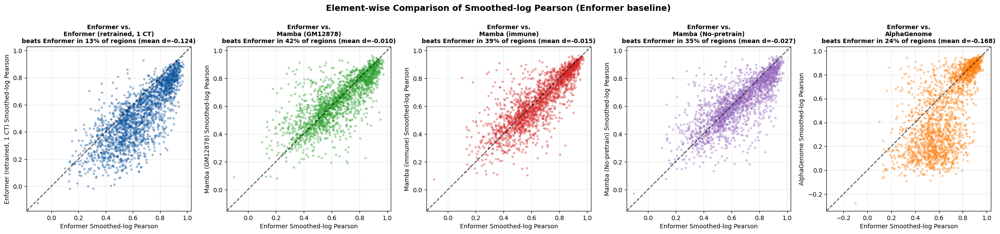

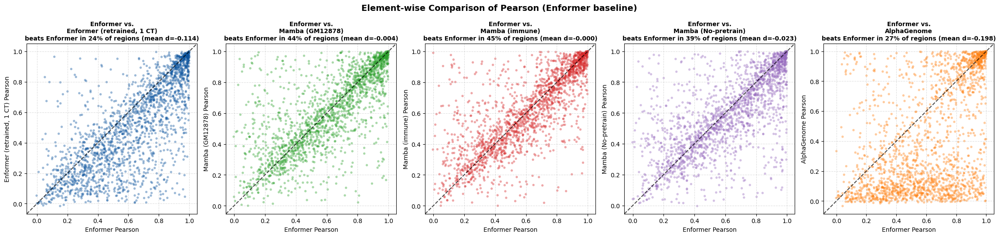

In [21]:
# §16 - element-wise (per-region) comparison against Enformer, both metrics.
CMP_KEYS = [RETRAIN_KEY, mamba_key, IMMUNE_KEY, NOPRETRAIN_KEY, ag_key]

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    base = res[enformer_key]
    fig, axes = plt.subplots(1, len(CMP_KEYS), figsize=(4.6 * len(CMP_KEYS), 5))
    for ax, k in zip(np.atleast_1d(axes), CMP_KEYS):
        comp = res[k]
        m = ~np.isnan(base) & ~np.isnan(comp)
        xb, yb = base[m], comp[m]
        ax.scatter(xb, yb, color=COLORS[k], alpha=0.4, s=15, edgecolor='none')
        lo, hi = min(xb.min(), yb.min()), max(xb.max(), yb.max())
        buf = (hi - lo) * 0.05
        ax.plot([lo - buf, hi + buf], [lo - buf, hi + buf], color='black', ls='--', alpha=0.7)
        win = float((yb > xb).mean())
        ax.set_xlabel(f'Enformer {meth}', fontsize=10)
        ax.set_ylabel(f'{PRETTY[k]} {meth}', fontsize=10)
        ax.set_title(f'Enformer vs.\n{PRETTY[k]}\nbeats Enformer in {win:.0%} of regions '
                     f'(mean d={np.mean(yb - xb):+.3f})', fontsize=10, weight='bold')
        ax.set_box_aspect(1)
        ax.set_xlim(lo - buf, hi + buf)
        ax.set_ylim(lo - buf, hi + buf)
        ax.grid(ls='--', alpha=0.4)
    plt.suptitle(f'Element-wise Comparison of {meth} (Enformer baseline)', fontsize=14,
                 weight='bold', y=1.03)
    plt.tight_layout()
    plt.show()

## 17. §8 repeated with the retrained 1-cell-type Enformer

Same 5 worst regions as §8 — the scan is model-independent, so `RULE`, `C2` and `WORST` are reused.
The retrained Enformer replaces the immune model in the track stack.

rank 1 (idx 1758)  chr14:100,819,717  Mamba (GM12878) 3%  Enformer (retrained, 1 CT) 6%  Enformer 4%  AlphaGenome 20%


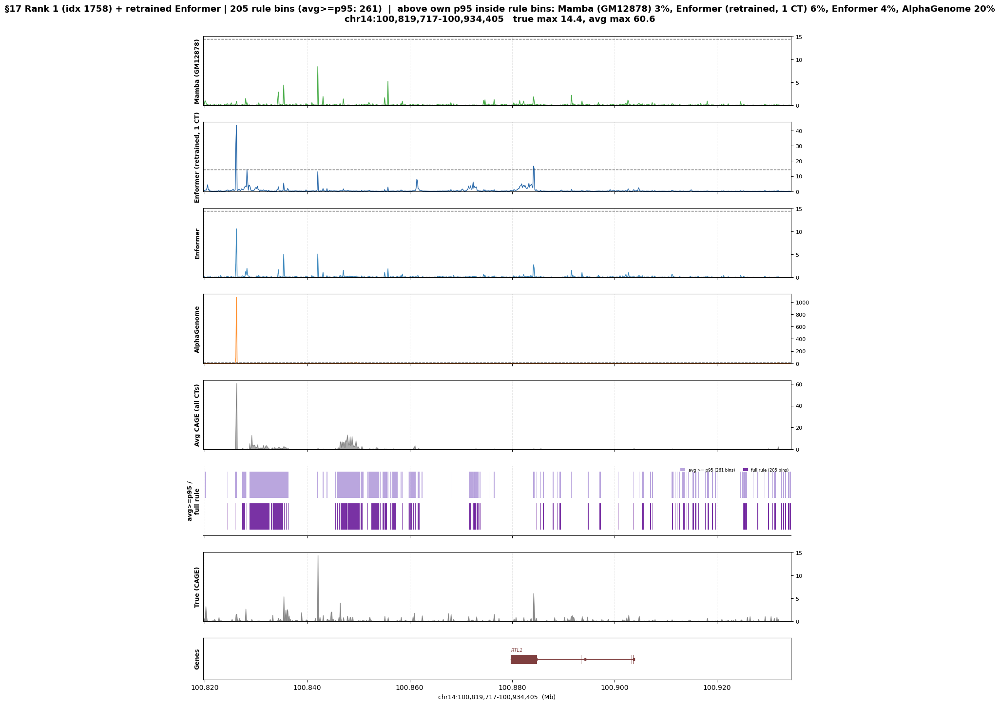

rank 2 (idx 1447)  chr11:35,197,431  Mamba (GM12878) 6%  Enformer (retrained, 1 CT) 7%  Enformer 9%  AlphaGenome 12%


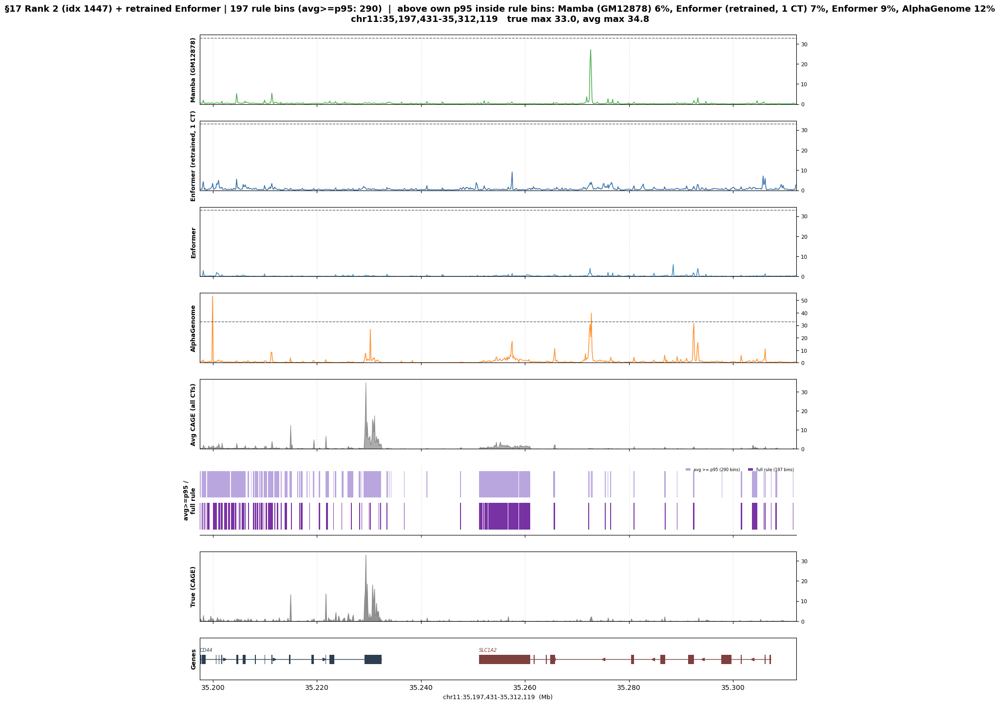

rank 3 (idx 1384)  chr15:25,005,401  Mamba (GM12878) 6%  Enformer (retrained, 1 CT) 5%  Enformer 10%  AlphaGenome 11%


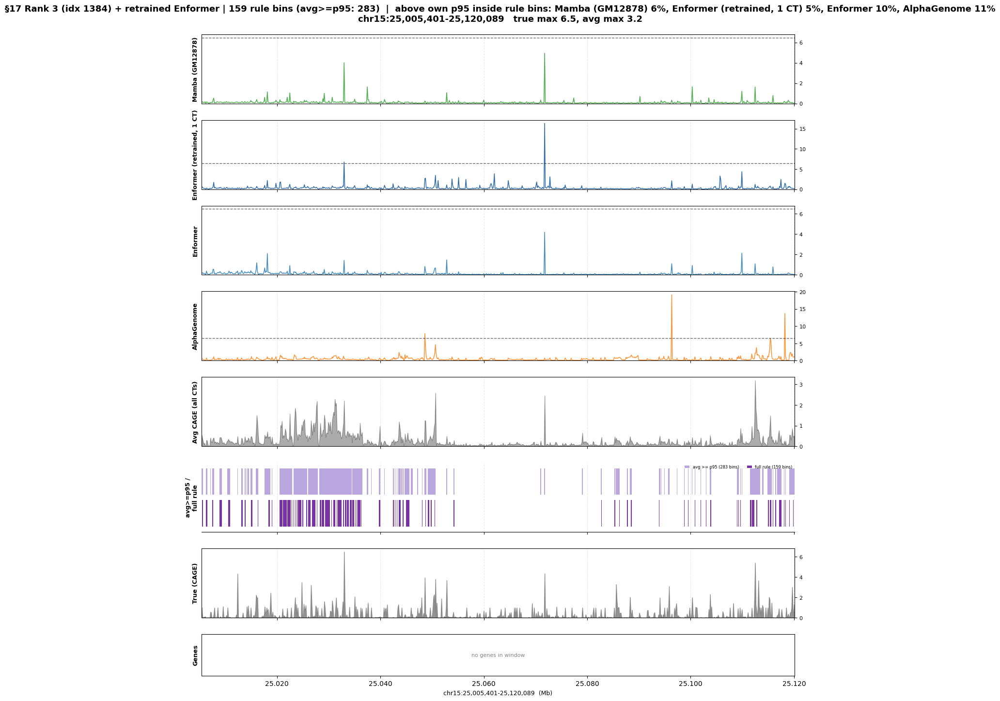

rank 4 (idx 1900)  chr11:35,082,742  Mamba (GM12878) 3%  Enformer (retrained, 1 CT) 4%  Enformer 3%  AlphaGenome 3%


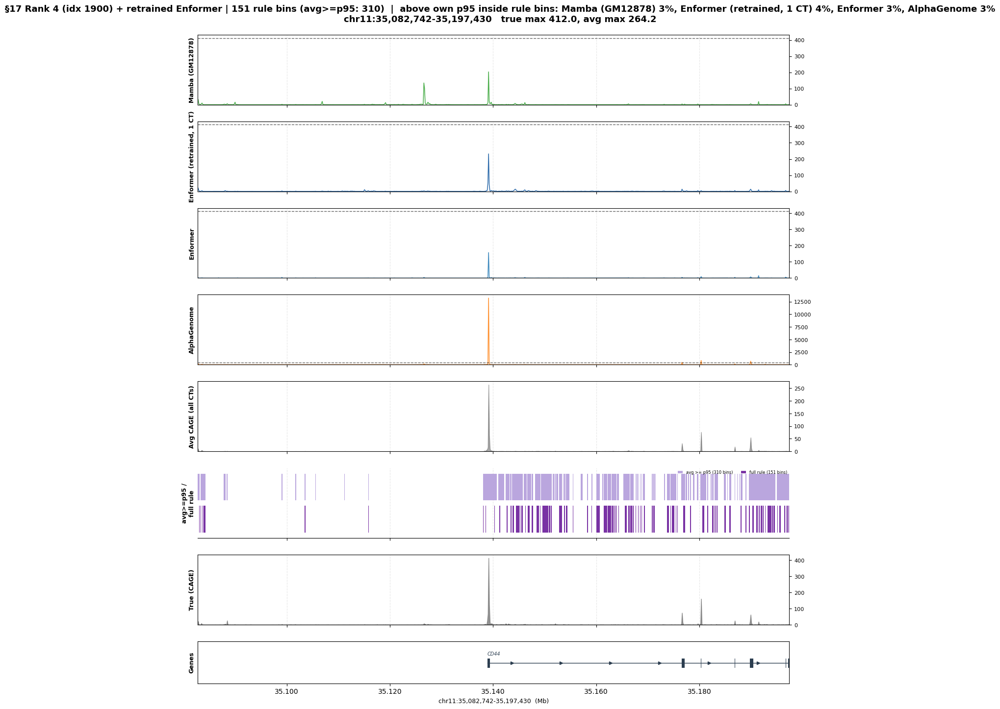

rank 5 (idx 1576)  chr3:188,870,350  Mamba (GM12878) 5%  Enformer (retrained, 1 CT) 18%  Enformer 6%  AlphaGenome 29%


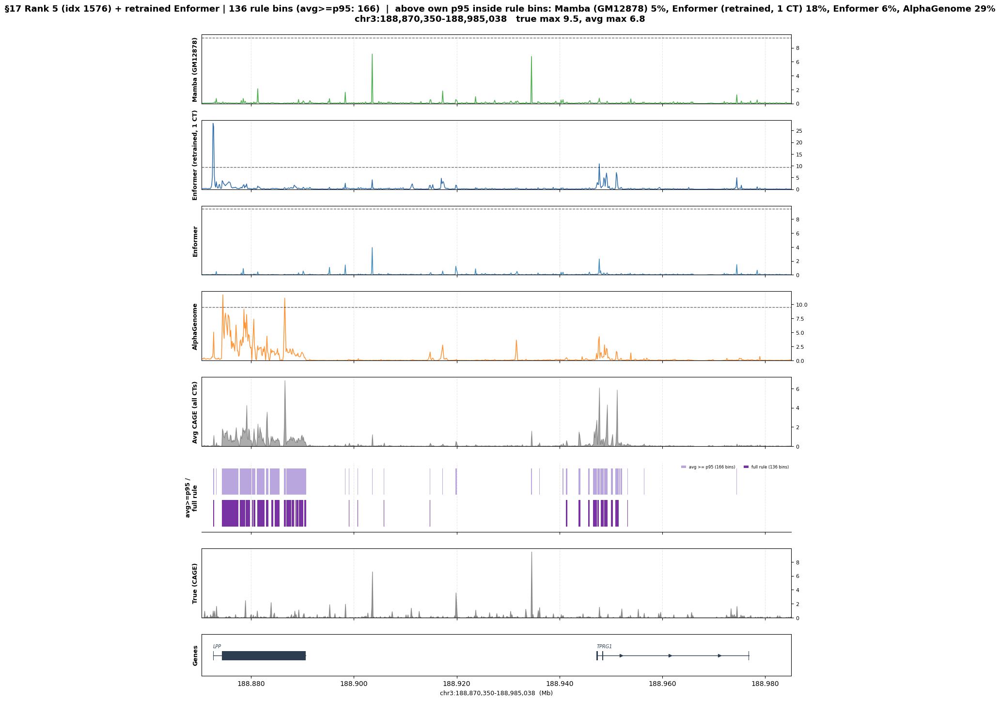

In [22]:
# §17 = §8/§11 with the retrained 1-cell-type Enformer in place of the immune model.
for rank, idx in enumerate(WORST):
    chrom, start, end = region_coords(idx)
    common = dict(chrom=chrom, start=start, bin_size=BIN)
    tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k], color=COLORS[k], **common)
              for k in MODEL_KEYS_RE]
    tracks.append(Track(AVG_ALL[idx], name='Avg CAGE (all CTs)', color='#111111',
                        style='fill', alpha=0.35, reference_exempt=True, **common))
    rule_slot = len(tracks)
    tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill',
                        alpha=0.0, reference_exempt=True, **common))
    truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)

    m = RULE[idx]
    frac = {k: (np.asarray(preds[k][idx])[m]
                >= np.percentile(np.asarray(preds[k][idx]), 95)).mean() for k in MODEL_KEYS_RE}
    title = (f'§17 Rank {rank+1} (idx {idx}) + retrained Enformer | {RULE[idx].sum()} rule bins '
             f'(avg>=p95: {C2[idx].sum()})  |  above own p95 inside rule bins: '
             + ', '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in MODEL_KEYS_RE)
             + f'\n{chrom}:{start:,}-{end:,}   true max {TRUE_ALL[idx].max():.1f}, '
               f'avg max {AVG_ALL[idx].max():.1f}')

    fig, axes = plot_tracks(tracks, genes=ann, region=(chrom, start, end), ground_truth=truth,
                            collapse_genes=True, title=title,
                            figsize=(13, 1.6 * (len(tracks) + 2) + 1.7))
    draw_rule_track(axes[rule_slot], idx, (start, end))
    print(f'rank {rank+1} (idx {idx})  {chrom}:{start:,}  ' +
          '  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in MODEL_KEYS_RE))
    plt.show()

## 18. §9 repeated with the retrained 1-cell-type Enformer

The four §9 metrics — specificity contrast `gap = R_avg - R_true`, magnitude over-prediction,
precision@k, and rule-enrichment of each model's false top-k bins — with the retrained Enformer in
place of the immune model. Only its column is computed; the rest are reused from §9a.

In [23]:
# §18a - extend the §9a metric table with the retrained Enformer, then reprint with 4 models.
if RETRAIN_KEY not in met:
    met[RETRAIN_KEY] = {c: np.full(len(eligible), np.nan) for c in cols}
    for row, i in enumerate(tqdm(eligible, desc='§18 retrained-Enformer metrics')):
        tr, av, ru = TRUE_ALL[i], AVG_ALL[i], RULE[i]
        pos = tr >= THR_T
        k = int(pos.sum())
        pr = np.asarray(preds[RETRAIN_KEY][i], dtype=np.float64)
        topk = np.argsort(pr)[-k:]
        fp = topk[~pos[topk]]
        m = met[RETRAIN_KEY]
        m['R_true'][row] = smoothed_log_pearson(pr, tr)
        m['R_avg'][row] = smoothed_log_pearson(pr, av)
        m['gap'][row] = m['R_avg'][row] - m['R_true'][row]
        m['prec_at_k'][row] = pos[topk].mean()
        m['log2_topk'][row] = np.median(np.log2((pr[topk] + 1) / (tr[topk] + 1)))
        j = int(np.argmax(pr))
        m['log2_summit'][row] = np.log2((pr[j] + 1) / (tr[j] + 1))
        if len(fp):
            m['fp_in_rule'][row] = ru[fp].mean()
else:
    print('retrained-Enformer metrics already computed - skipped')

print(f"\n{'':<28}{'R_true':>8}{'R_avg':>8}{'gap':>8}{'prec@k':>8}"
      f"{'log2_topk':>10}{'log2_sum':>9}{'FPinRule':>9}{'enrich':>8}")
for key in MODEL_KEYS_RE:
    m = met[key]
    fr = np.nanmedian(m['fp_in_rule'])
    print(f'{PRETTY[key]:<28}' + ''.join(f'{np.nanmedian(m[c]):>8.3f}' for c in cols[:4])
          + f"{np.nanmedian(m['log2_topk']):>10.2f}{np.nanmedian(m['log2_summit']):>9.2f}"
          + f'{fr:>9.3f}{fr / RULE_PREV:>7.1f}x')

print('\ngap vs rule-bin count:')
for key in MODEL_KEYS_RE:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    print(f'  {PRETTY[key]:<28} Spearman rho {rho:>+.3f} (p {pv:.1e})   '
          f'median gap {np.median(g_[ok]):>+.3f}')

strat_re = {key: {c: [] for c in ['gap', 'prec_at_k', 'log2_summit']} for key in MODEL_KEYS_RE}
for (lo, hi) in STRATA:
    sel = (RC_ELIG >= lo) & (RC_ELIG <= hi)
    for key in MODEL_KEYS_RE:
        for c in ['gap', 'prec_at_k', 'log2_summit']:
            strat_re[key][c].append(np.nanmedian(met[key][c][sel]))
for c, lab in [('gap', 'median gap = R_avg - R_true'), ('prec_at_k', 'median precision@k'),
               ('log2_summit', 'median log2 excess at summit')]:
    print(f'\n{lab}  (columns = rule bins per region)')
    print(f"{'':<28}" + ''.join(f'{s:>10}' for s in STRATA_LAB))
    for key in MODEL_KEYS_RE:
        print(f'{PRETTY[key]:<28}' + ''.join(f'{v:>+10.3f}' for v in strat_re[key][c]))

print(f'\nidx {MARK_IDX}:')
for key in MODEL_KEYS_RE:
    m = met[key]
    print(f'  {PRETTY[key]:<28} R_true {m["R_true"][mark_row]:>6.3f}  '
          f'R_avg {m["R_avg"][mark_row]:>6.3f}  gap {m["gap"][mark_row]:>+6.3f}  '
          f'prec@k {m["prec_at_k"][mark_row]:>5.2f}  FPinRule {m["fp_in_rule"][mark_row]:>5.2f}  '
          f'log2summit {m["log2_summit"][mark_row]:>+6.2f}')

§18 retrained-Enformer metrics: 100%|██████████| 1880/1880 [00:03<00:00, 608.49it/s]



                              R_true   R_avg     gap  prec@k log2_topk log2_sum FPinRule  enrich
Mamba (GM12878)                0.652   0.724   0.051   0.429      0.48     0.57    0.043    3.3x
Enformer (retrained, 1 CT)     0.527   0.675   0.091   0.357      1.14     1.19    0.071    5.4x
Enformer                       0.659   0.797   0.088   0.444      0.28     0.25    0.083    6.3x
AlphaGenome                    0.459   0.646   0.079   0.244      1.43     2.94    0.110    8.2x

gap vs rule-bin count:
  Mamba (GM12878)              Spearman rho -0.462 (p 8.3e-100)   median gap +0.051
  Enformer (retrained, 1 CT)   Spearman rho -0.100 (p 1.4e-05)   median gap +0.091
  Enformer                     Spearman rho -0.304 (p 1.6e-41)   median gap +0.088
  AlphaGenome                  Spearman rho -0.009 (p 6.9e-01)   median gap +0.079

median gap = R_avg - R_true  (columns = rule bins per region)
                                     0       1-4      5-19     20-49       50+
Mamba (GM12878)

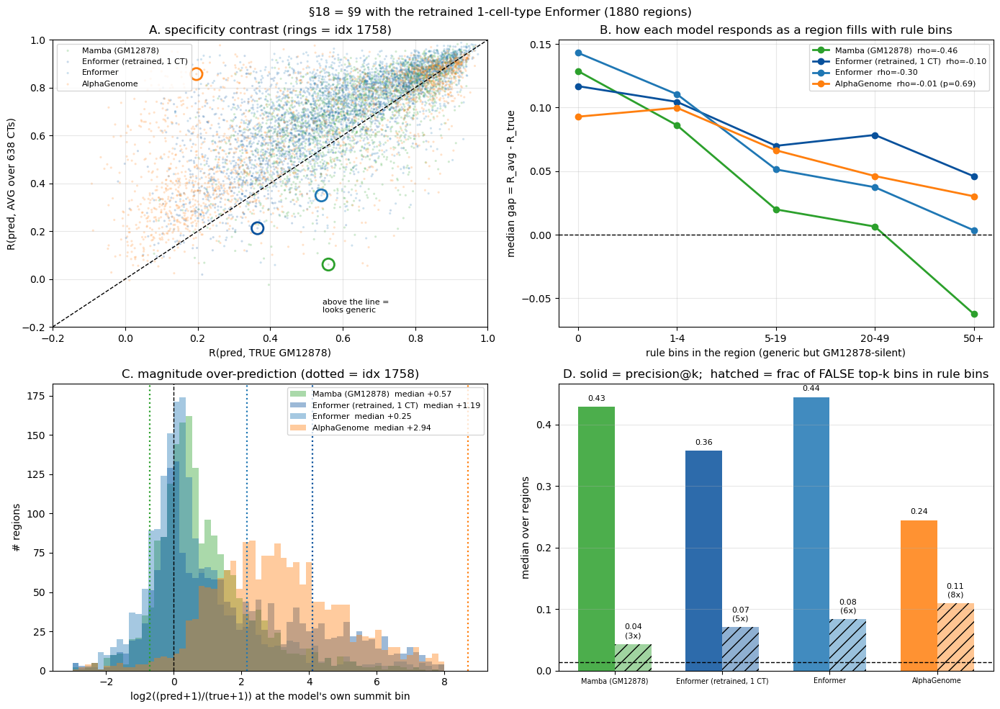

In [24]:
# §18b - the §9b figure with the retrained Enformer.
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

ax = axes[0, 0]
for key in MODEL_KEYS_RE:
    m = met[key]
    ax.scatter(m['R_true'], m['R_avg'], s=5, alpha=0.22, color=COLORS[key], label=PRETTY[key],
               edgecolors='none')
    ax.scatter(m['R_true'][mark_row], m['R_avg'][mark_row], s=140, facecolors='none',
               edgecolors=COLORS[key], linewidths=2, zorder=5)
ax.plot([-0.2, 1.0], [-0.2, 1.0], color='k', lw=1, ls='--')
ax.text(0.62, 0.05, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.set_xlim(-0.2, 1.0)
ax.set_ylim(-0.2, 1.0)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel('R(pred, AVG over 638 CTs)')
ax.set_title(f'A. specificity contrast (rings = idx {MARK_IDX})')
ax.legend(fontsize=8, loc='upper left')
ax.grid(alpha=0.3)

ax = axes[0, 1]
xs = np.arange(len(STRATA_LAB))
for key in MODEL_KEYS_RE:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    ax.plot(xs, strat_re[key]['gap'], 'o-', color=COLORS[key], lw=2,
            label=f'{PRETTY[key]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels(STRATA_LAB)
ax.set_xlabel('rule bins in the region (generic but GM12878-silent)')
ax.set_ylabel('median gap = R_avg - R_true')
ax.set_title('B. how each model responds as a region fills with rule bins')
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

ax = axes[1, 0]
bins = np.linspace(-3, 8, 60)
for key in MODEL_KEYS_RE:
    v = met[key]['log2_summit']
    ax.hist(v[~np.isnan(v)], bins=bins, color=COLORS[key], alpha=0.40,
            label=f'{PRETTY[key]}  median {np.nanmedian(v):+.2f}')
    ax.axvline(met[key]['log2_summit'][mark_row], color=COLORS[key], ls=':', lw=1.6)
ax.axvline(0, color='k', lw=1, ls='--')
ax.set_xlabel('log2((pred+1)/(true+1)) at the model\'s own summit bin')
ax.set_ylabel('# regions')
ax.set_title(f'C. magnitude over-prediction (dotted = idx {MARK_IDX})')
ax.legend(fontsize=8)

ax = axes[1, 1]
w = 0.34
for j, key in enumerate(MODEL_KEYS_RE):
    pk = np.nanmedian(met[key]['prec_at_k'])
    fr = np.nanmedian(met[key]['fp_in_rule'])
    ax.bar(j - w / 2, pk, w, color=COLORS[key], alpha=0.85)
    ax.bar(j + w / 2, fr, w, color=COLORS[key], alpha=0.45, hatch='//')
    ax.text(j - w / 2, pk + 0.01, f'{pk:.2f}', ha='center', fontsize=8)
    ax.text(j + w / 2, fr + 0.01, f'{fr:.2f}\n({fr/RULE_PREV:.0f}x)', ha='center', fontsize=8)
ax.axhline(RULE_PREV, color='k', lw=1, ls='--')
ax.set_xticks(range(len(MODEL_KEYS_RE)))
ax.set_xticklabels([PRETTY[k] for k in MODEL_KEYS_RE], fontsize=7)
ax.set_ylabel('median over regions')
ax.set_title('D. solid = precision@k;  hatched = frac of FALSE top-k bins in rule bins')
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§18 = §9 with the retrained 1-cell-type Enformer ({len(eligible)} regions)',
             fontsize=12)
fig.tight_layout()
plt.show()

## 19. §10 repeated with the retrained 1-cell-type Enformer

x = `R(TRUE GM12878, AVG)` per region (model-independent, unchanged); y = `R(pred, TRUE)` then
`R(pred, AVG)`. Raw Pearson first, smoothed-log second.

§19 retrained correlations: 100%|██████████| 1880/1880 [00:02<00:00, 820.29it/s]


median y by x-tertile (raw Pearson):
tertile                            Mamba (GM12878)    Enformer (retrained, 1 CT)                      Enformer                   AlphaGenome
                             R_true          R_avg         R_true          R_avg         R_true          R_avg         R_true          R_avg
specific  x<0.65              0.441          0.468          0.266          0.473          0.403          0.588          0.129          0.423
middle                        0.647          0.699          0.525          0.600          0.674          0.766          0.204          0.329
generic   x>=0.89             0.892          0.892          0.831          0.845          0.916          0.922          0.895          0.929


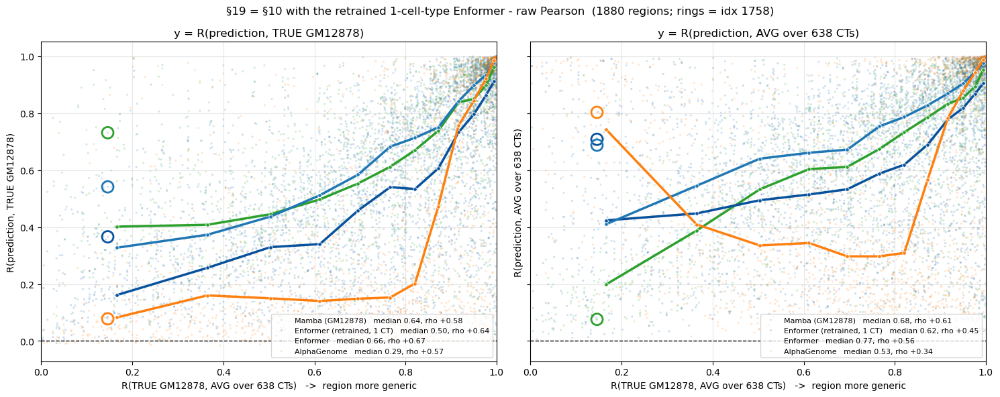

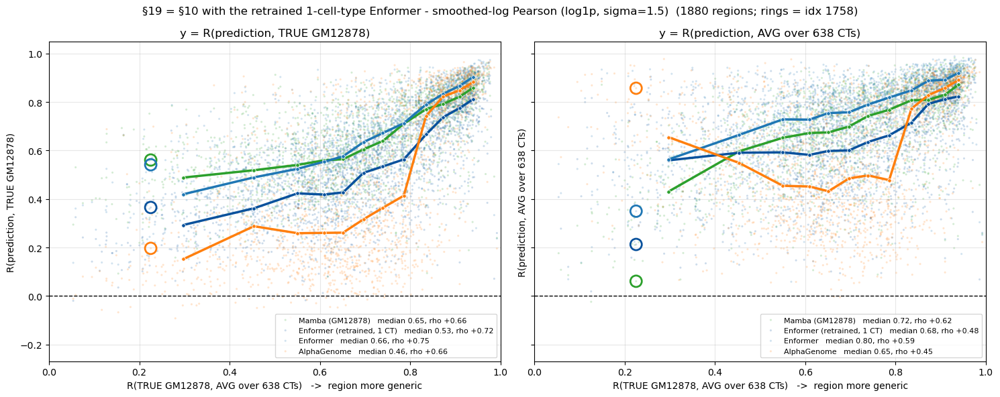

In [25]:
# §19 = §10/§13 with the retrained 1-cell-type Enformer.
if RETRAIN_KEY not in y_raw:
    y_raw[RETRAIN_KEY] = {'true': np.full(len(eligible), np.nan),
                          'avg': np.full(len(eligible), np.nan)}
    for row, i in enumerate(tqdm(eligible, desc='§19 retrained correlations')):
        pr = np.asarray(preds[RETRAIN_KEY][i], dtype=np.float64)
        y_raw[RETRAIN_KEY]['true'][row] = raw_pearson(pr, TRUE_ALL[i])
        y_raw[RETRAIN_KEY]['avg'][row] = raw_pearson(pr, AVG_ALL[i])
else:
    print('retrained raw correlations already computed - skipped')
y_sm[RETRAIN_KEY] = {'true': met[RETRAIN_KEY]['R_true'], 'avg': met[RETRAIN_KEY]['R_avg']}

print('median y by x-tertile (raw Pearson):')
print(f"{'tertile':<20}" + ''.join(f'{PRETTY[k]:>30}' for k in MODEL_KEYS_RE))
print(f"{'':<20}" + ''.join(f"{'R_true':>15}{'R_avg':>15}" for _ in MODEL_KEYS_RE))
for lab, sel in terts:
    print(f'{lab:<20}' + ''.join(
        f"{np.nanmedian(y_raw[k]['true'][sel]):>15.3f}{np.nanmedian(y_raw[k]['avg'][sel]):>15.3f}"
        for k in MODEL_KEYS_RE))

for tag, x, y in [('raw Pearson', x_raw, y_raw),
                  ('smoothed-log Pearson (log1p, sigma=1.5)', x_sm, y_sm)]:
    fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 'true', 'R(prediction, TRUE GM12878)'),
                            (axes[1], 'avg', 'R(prediction, AVG over 638 CTs)')]:
        for key in MODEL_KEYS_RE:
            yy = y[key][which]
            ok = ~np.isnan(x) & ~np.isnan(yy)
            rho = spearmanr(x[ok], yy[ok])[0]
            ax.scatter(x, yy, s=5, alpha=0.20, color=COLORS[key], edgecolors='none',
                       label=f'{PRETTY[key]}   median {np.nanmedian(yy):.2f}, rho {rho:+.2f}')
            cx, cy = running_median(x, yy)
            ax.plot(cx, cy, '-o', color=COLORS[key], lw=2.5, ms=4,
                    markeredgecolor='white', markeredgewidth=0.6, zorder=6)
            ax.scatter(x[mark_row], yy[mark_row], s=150, facecolors='none',
                       edgecolors=COLORS[key], linewidths=2, zorder=7)
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        ax.set_xlabel('R(TRUE GM12878, AVG over 638 CTs)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}')
        ax.legend(fontsize=8, loc='lower right')
        ax.grid(alpha=0.3)
    fig.suptitle(f'§19 = §10 with the retrained 1-cell-type Enformer - {tag}  '
                 f'({len(eligible)} regions; rings = idx {MARK_IDX})', fontsize=12)
    fig.tight_layout()
    plt.show()